In [5]:
%matplotlib notebook


In [6]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import datetime
#import matplotlib.colors 
import matplotlib.cm as cm
#import scipy.interpolate as inter
import os
from scipy.optimize import curve_fit
# from lmfit import Model, Parameters
# from lmfit import Parameter
import sys
import warnings
from scipy.signal import savgol_filter
from importlib import reload

warnings.simplefilter('ignore')  # shut off the warnings about slices

########################## need to change file path ##########################

# folder_that_contains_code='/Users/dongheehoh/Dropbox/Kramer lab/IDEAspec/IDEASpecPy'
folder_that_contains_code=r'/Users/aditisubramaniraju/Documents/March 2023/20220817 Wayne plants/IDEASpecPy'
#folder_that_contains_code='/Users/davidkramer/Dropbox/kramerLabSoftware/IDEASpec/IDEASpecPy'

#adds the folder to your system path
sys.path.append(os.path.abspath(folder_that_contains_code)) #AK_ECS_multiwavelength_DMK_3 for fast_NPQ_3e-Copy2.py"))

#imports the code for this analysis

import IDEASpecPy as Ipy



I am renewed!
Component spectra reset.
combineExperiment exists


In [7]:
project_name = "Chibini Test Project_1"

project_DF = Ipy.set_up_project_dataframe (project_name, over_write = True)

project_DF

notes_file_name = Chibini Test Project_1.csv
Generating new dataframe
The following sub folders are included in the project :
-------------------------------------------
scanning folder for JSON files: Summary_figures
-------------------------------------------
-------------------------------------------
scanning folder for JSON files: 20220627 tpt3 pht2
-------------------------------------------
new file
protocol_name = "Tpt3/Pht2;1 in Sgs3-13
['ecs_dirk', 'lirk_parsing', 'p700_dirk', 'flu']
0 ecs_dirk
1 lirk_parsing
2 p700_dirk
3 flu
-------------------------------------------
scanning folder for JSON files: 20220627 pht2
-------------------------------------------
new file
protocol_name = "Pht2;1 in Sgs3-13
['ecs_dirk', 'lirk_parsing', 'p700_dirk', 'flu']
0 ecs_dirk
1 lirk_parsing
2 p700_dirk
3 flu
-------------------------------------------
scanning folder for JSON files: 20220627 Tpt3
-------------------------------------------
new file
protocol_name = "Tpt3 in Sgs3-13
['ecs_dirk

,name,subfolder,notes,checksum,added notes,protocol_labels,notes_beginning,actinic_intensity,start_times
0,Tpt3_pht2,20220627 tpt3 pht2/Tpt3_pht2,Tpt3/Pht2;1 in Sgs3-13 plast[5.3m] 5-18-22,8bfe12d6c51ccc39125c294cda715000,NaN,"[ecs_dirk, lirk_parsing, p700_dirk, flu]","""Tpt3/Pht2;1 in Sgs3-13","[[0, 255, 0, 0, 0, 0], [0, 5, 0, 5], [5, 255, ...","[821747.9, 830583.8, 1022075.0, 1082486.0, 121..."
1,pht2,20220627 pht2/pht2,Pht2;1 in Sgs3-13 plast[5.3m] 5-18-22,ea59408320b45a17f992e6f4caf09654,NaN,"[ecs_dirk, lirk_parsing, p700_dirk, flu]","""Pht2;1 in Sgs3-13","[[0, 255, 0, 0, 0, 0], [0, 5, 0, 5], [5, 255, ...","[835769.3, 844621.1, 1035935.0, 1096427.0, 122..."
2,Tpt3,20220627 Tpt3/Tpt3,Tpt3 in Sgs3-13 plast[5.3m] 5-18-22,41505f0651b2f226ea883534d1e8c82f,NaN,"[ecs_dirk, lirk_parsing, p700_dirk, flu]","""Tpt3 in Sgs3-13","[[0, 255, 0, 0, 0, 0], [0, 5, 0, 5], [5, 255, ...","[804087.2, 812893.8, 1004201.0, 1064529.0, 119..."
3,paper1,test_burn/paper1,pink paper,625576c638f96f65098e553d69e93b89,NaN,"[ecs_dirk, lirk_parsing, flu]","""pink paper","[[0, 256, 0, 0, 0, 0], [0, 50, 0, 50], [50, 25...","[55395.73, 65180.02, 137413.3, 200190.6, 22136..."
4,Sgs3-13,20220627 Sgs3-13/Sgs3-13,Sgs3-13 5-18-22,4cb46aec2100e4ab4b89205bf9cbc437,NaN,"[ecs_dirk, lirk_parsing, p700_dirk, flu]","""Sgs3-13","[[0, 255, 0, 0, 0, 0], [0, 5, 0, 5], [5, 255, ...","[778005.1, 786840.0, 978186.3, 1038560.0, 1167..."


In [8]:
print("all protocol labels:\n", project_DF['protocol_labels'])

all protocol labels:
 0    [ecs_dirk, lirk_parsing, p700_dirk, flu]
1    [ecs_dirk, lirk_parsing, p700_dirk, flu]
2    [ecs_dirk, lirk_parsing, p700_dirk, flu]
3               [ecs_dirk, lirk_parsing, flu]
4    [ecs_dirk, lirk_parsing, p700_dirk, flu]
Name: protocol_labels, dtype: object


In [9]:
project_DF['analyze'] = True


In [10]:
# Import the data files (".._combined.json") into the dataframe
# Only import the data with analyze == True

all_files_exist = True

baseFileNames = {}

test = ""
project_DF['data'] = 0
project_DF['data'] = project_DF['data'].astype('object')

for index in project_DF.index:
#     json_file_name = user_data_folder + master_folder + project_DF.loc[index, 'subfolder'] + '/' + project_DF.loc[index, 'name'] + '_combined.json'
    json_file_name = project_DF.loc[index, 'subfolder'] + '_combined.json'
    print(json_file_name)
    if os.path.exists(json_file_name):
        if (project_DF.loc[index, 'analyze'] == True):
            baseFileNames[json_file_name] = project_DF.loc[index, 'name']
            test = pd.read_json(json_file_name) 
            test = test.sort_values('start_time')
            project_DF['data'][index] = test
            print('found: ' + json_file_name)
    else:
        print('missing: ' + json_file_name)
        all_files_exist = False

if not all_files_exist:
    print('Some files missing.')
else:
    print("found all files in notes.")

20220627 tpt3 pht2/Tpt3_pht2_combined.json
found: 20220627 tpt3 pht2/Tpt3_pht2_combined.json
20220627 pht2/pht2_combined.json
found: 20220627 pht2/pht2_combined.json
20220627 Tpt3/Tpt3_combined.json
found: 20220627 Tpt3/Tpt3_combined.json
test_burn/paper1_combined.json
found: test_burn/paper1_combined.json
20220627 Sgs3-13/Sgs3-13_combined.json
found: 20220627 Sgs3-13/Sgs3-13_combined.json
found all files in notes.


In [11]:

##################set colors in here, need to change keys in dictionary #######################
colors ={"Sgs3-13" :"black",
         "pht2" : "red",
         "Tpt3" : "blue",
         "Tpt3_pht2" : "purple"
        }



<IPython.core.display.Javascript object>


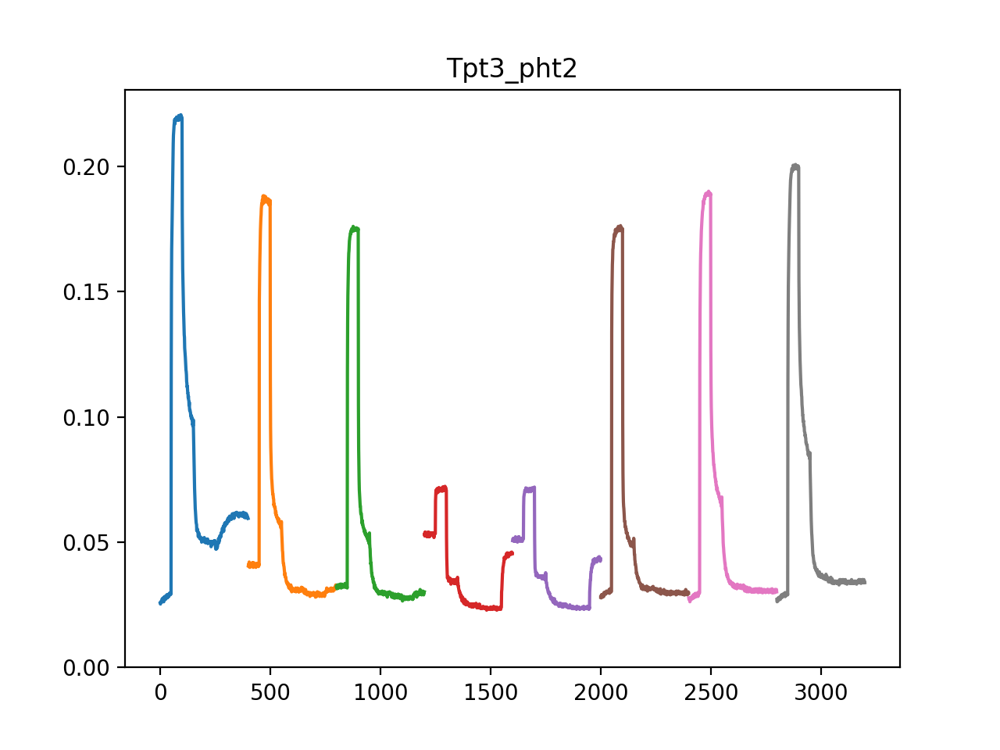

<IPython.core.display.Javascript object>


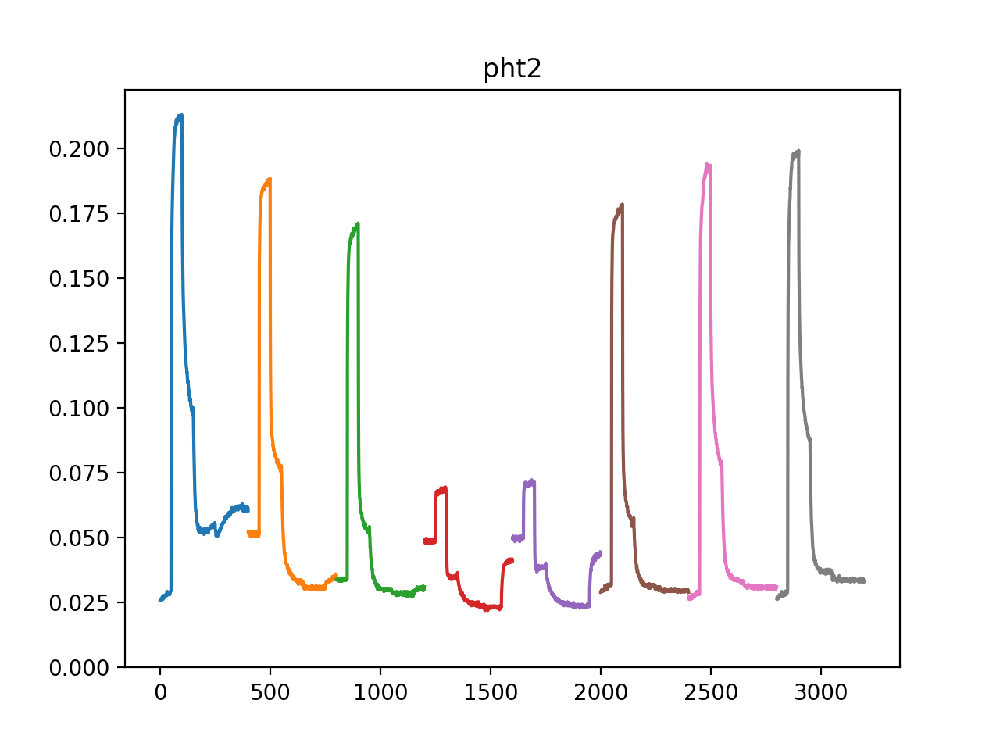

<IPython.core.display.Javascript object>


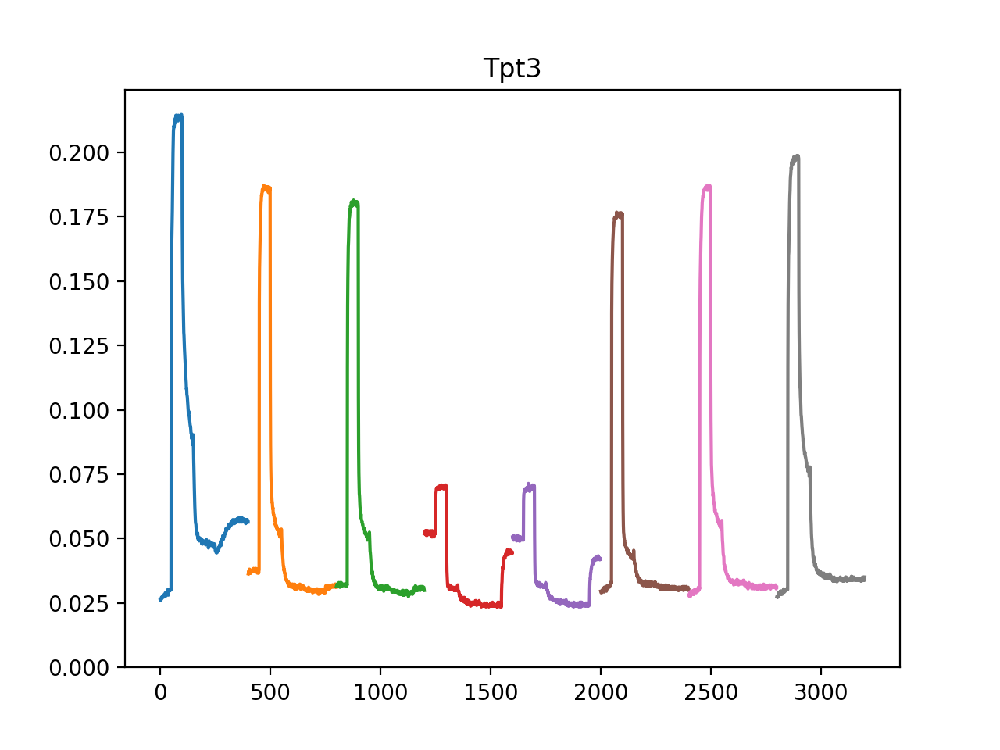

<IPython.core.display.Javascript object>


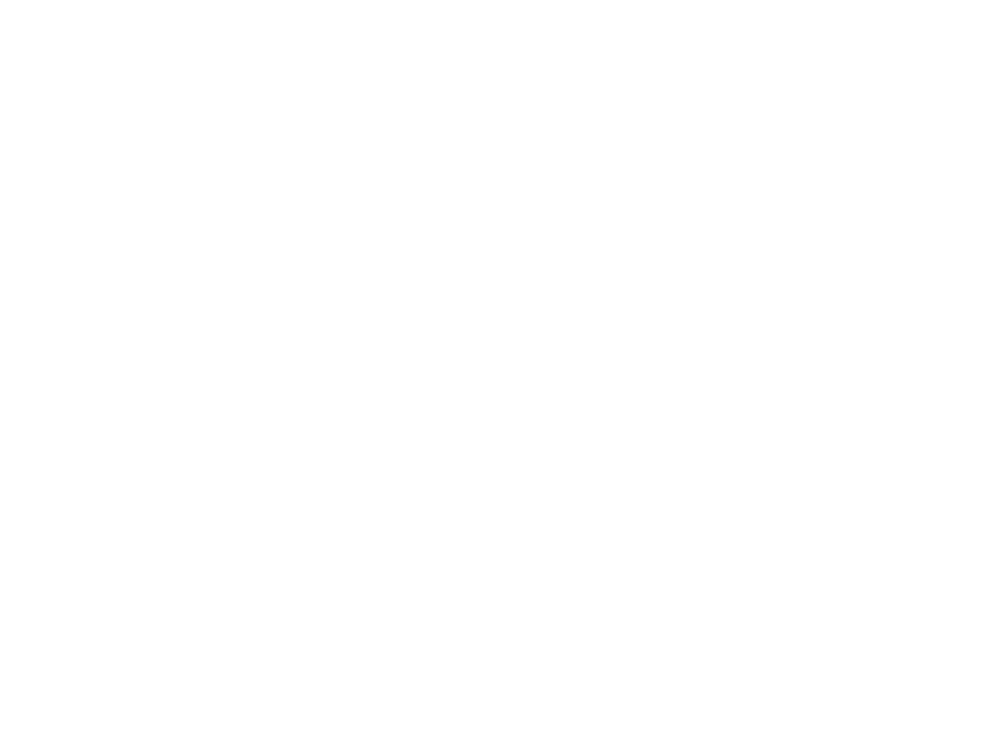

<IPython.core.display.Javascript object>


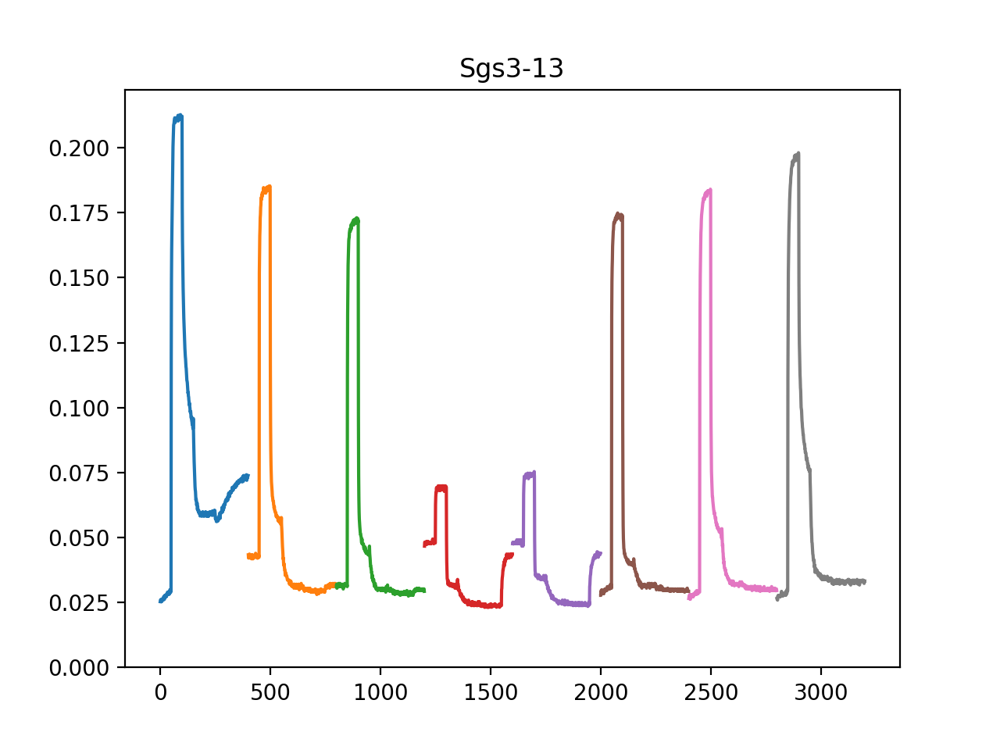

In [12]:
use_top_points_for_FM = [1,10]

project_DF['combined_fluor'] = 0
project_DF['combined_fluor'] = project_DF['combined_fluor'].astype('object')

# make a new column in the project_DF to hold the Phi2 arrays

project_DF['Fv/Fmp'] = 0  # because the values are objects (not single numbers)
                          # we have to do this in two steps. (It is stupid!)
                          # First, set it up as single value, e.g., all 0
                          # Next, reset as a type 'object', asin the following:
            
project_DF['Fv/Fmp'] = project_DF['Fv/Fmp'].astype('object')

project_DF['Fmp'] = 0
project_DF['Fmp'] = project_DF['Fmp'].astype('object')

project_DF['NPQ'] = 0
project_DF['NPQ'] = project_DF['NPQ'].astype('object')

# make a new column in the project_DF to hold the PAR arrays

project_DF['PAR'] = 0  # because the values are objects (not single numbers)
                          # we have to do this in two steps. (It is stupid!)
                          # First, set it up as single value, e.g., all 0
                          # Next, reset as a type 'object', asin the following:
            
project_DF['PAR'] = project_DF['PAR'].astype('object')

# now, we can use the "Fv/Fmp" column to store arrays or dataframes etc. 

for index in project_DF.index:
    plt.figure()
    
    traces_DF = project_DF['data'][index] 
    name = project_DF['name'][index]
    if ('paper' not in name):
        plt.title(name)
        fluor_traces = traces_DF[traces_DF['trace_label'] == 'flu']
        fluor_traces.sort_values('start_time')
        combined_fluor = []
        cumulative_points = 0
        Phi2_vals = []
        PAR = []
        Fmp_vals =[]
        NPQ_vals = []
        
        for i, trace_index in enumerate(fluor_traces.index):
            fluor_trace = fluor_traces['flu_I'][trace_index]

            # number_pulses column contains arrays of the number of mearuring pulses

            number_pulses = fluor_traces['number_pulses'][trace_index]

            beginning_of_sat_pulse_index = number_pulses[0]
            end_of_sat_pulse_index = number_pulses[0] + number_pulses[1]

            sat_pulse_trace = fluor_trace[beginning_of_sat_pulse_index: end_of_sat_pulse_index]
            Fm_points = np.sort(sat_pulse_trace)[::-1][use_top_points_for_FM[0]:use_top_points_for_FM[1]]
            Fmp = np.mean(Fm_points)
            Fmp_vals.append(Fmp)
            if (i == 0):
                Fm = Fmp
            NPQ = (Fm-Fmp)/Fmp
            NPQ_vals.append(NPQ)
            Fs = fluor_trace[10]  # make Fs the 10thh point of each sub-trace, fluor_trace

            Phi2 = (Fmp-Fs)/Fmp

            Phi2_vals.append(Phi2)
            PAR.append(fluor_traces.loc[trace_index, 'actinic_intensity'][0])

            fluor_trace_points = np.arange(cumulative_points, cumulative_points + len(fluor_trace))

            cumulative_points = cumulative_points + len(fluor_trace)

            combined_fluor = combined_fluor + fluor_trace
            plt.plot(fluor_trace_points, fluor_trace)

        combined_fluor = np.array(combined_fluor)
        combined_fluor = combined_fluor/combined_fluor[0]  # normalize to first point
        project_DF['combined_fluor'][index] = combined_fluor
        project_DF['Fv/Fmp'][index] = Phi2_vals  # store the Phi2_vals array in the column, row
        project_DF['Fmp'][index] = Fmp_vals
        project_DF['NPQ'][index] = NPQ_vals
    #     plt.plot(combined_fluor, alpha = 0.1)  # this method of indexing is better for objects
        plt.ylim(ymin=0)
        plt.show()

<IPython.core.display.Javascript object>


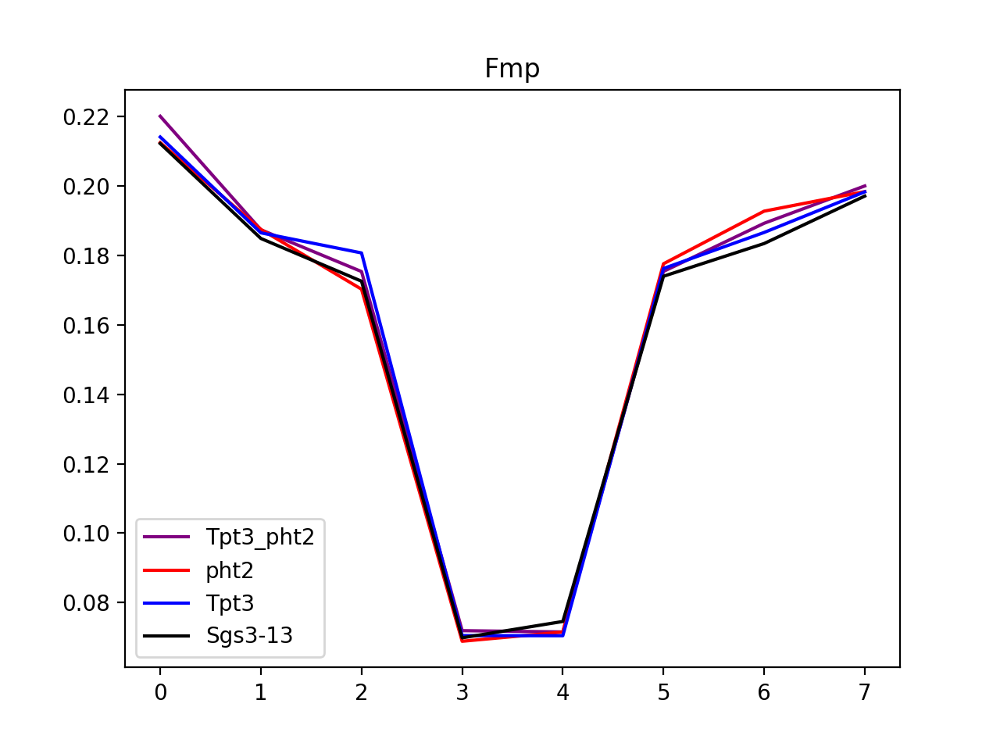

<IPython.core.display.Javascript object>


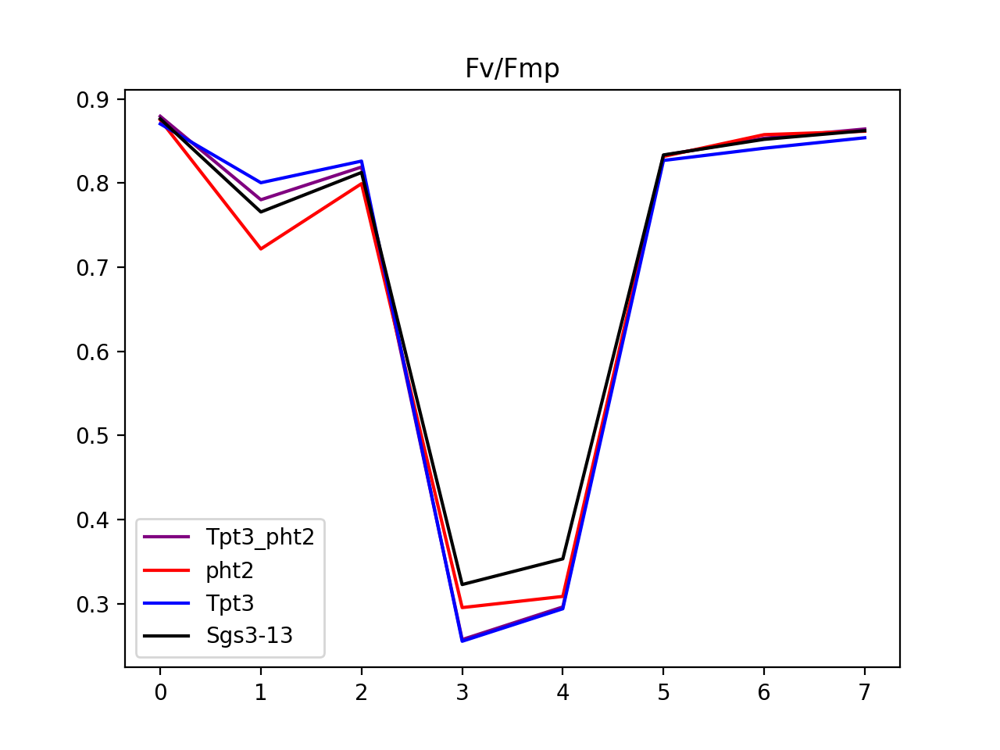

<IPython.core.display.Javascript object>


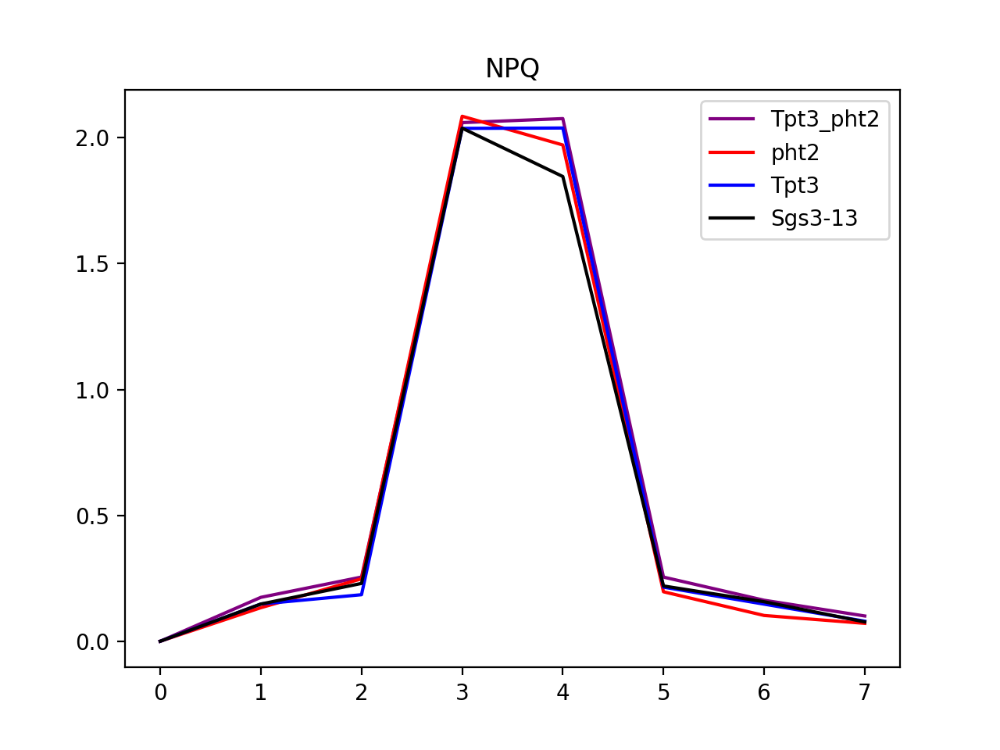

In [13]:
plot_these = ['Fmp', 'Fv/Fmp', 'NPQ']

for plot_this in plot_these:
    plt.figure()
    plt.title(plot_this)
    for index in project_DF.index:
        name = project_DF['name'][index]
        if ('paper' not in name):
            plt.plot(project_DF[plot_this][index], label = name, color=colors[name] )
    plt.legend()
    plt.show()

<IPython.core.display.Javascript object>


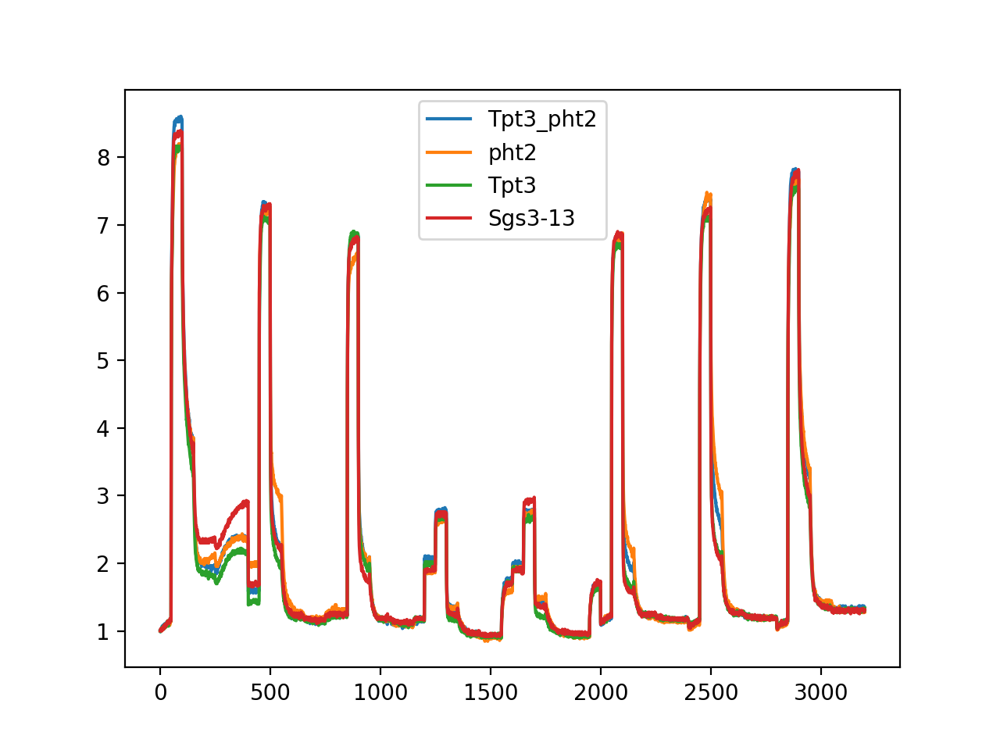

In [14]:
plt.figure()
for index in project_DF.index:
    name = project_DF['name'][index]
    if ('paper' not in name):
        plt.plot(project_DF['combined_fluor'][index], label = name)
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


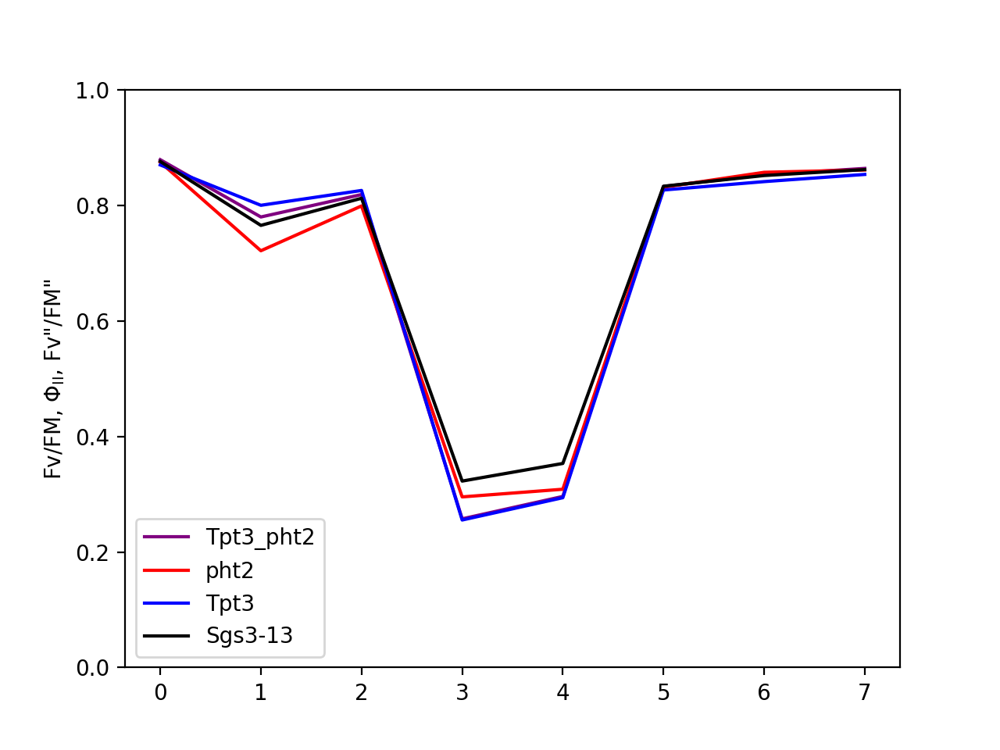

In [15]:
plt.figure()
for index in project_DF.index:
    name = project_DF['name'][index]
    if ('paper' not in name):
        plt.plot(project_DF['Fv/Fmp'][index], label = name, color=colors[name] )
        
plt.ylim(0,1)
plt.ylabel('Fv/FM, $\mathregular{Φ_{II}}$, Fv"/FM"')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


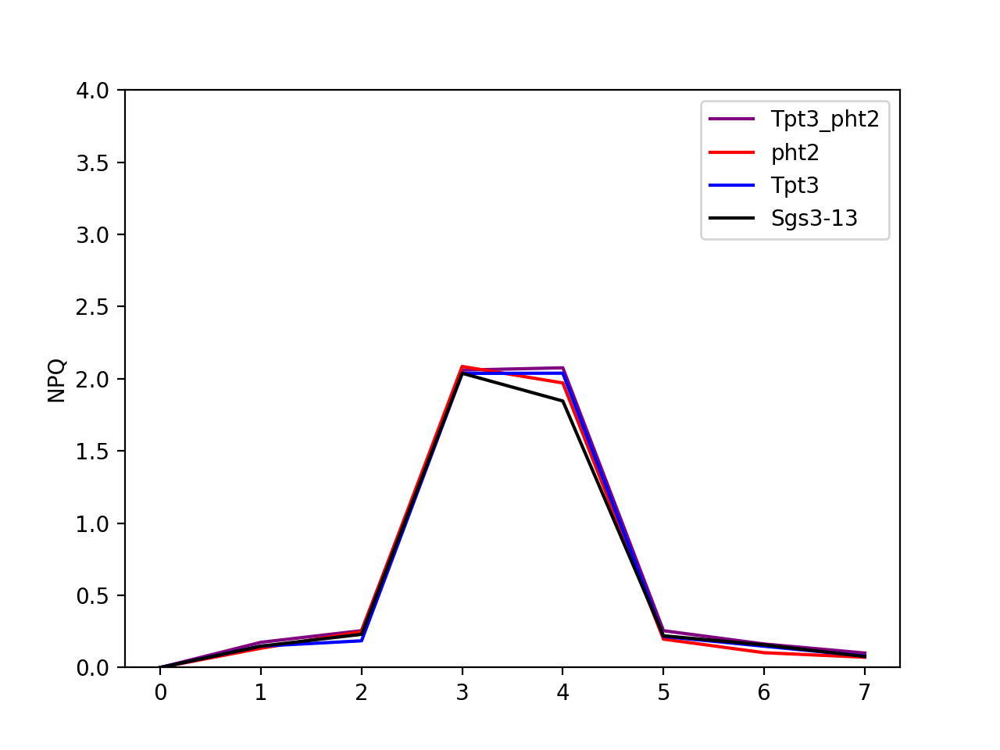

In [16]:
plt.figure()
for index in project_DF.index:
    name = project_DF['name'][index]
    if ('paper' not in name):
        plt.plot(project_DF['NPQ'][index], label = name , color=colors[name] )
        
plt.ylim(0,4)
plt.ylabel('NPQ')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


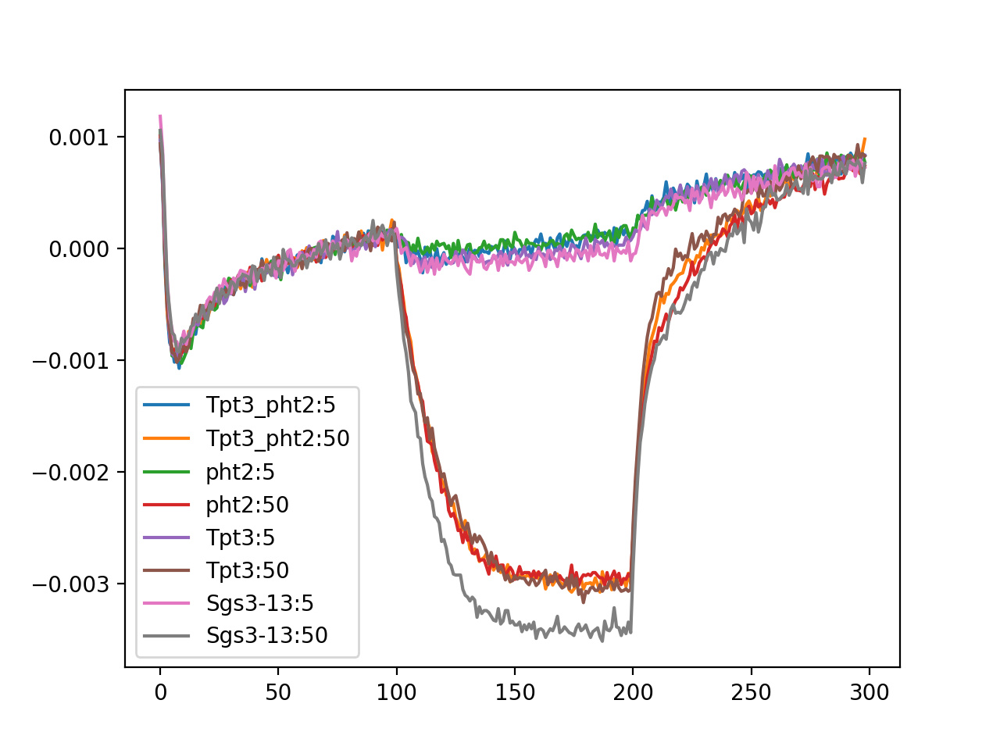

In [17]:
# reload(Ipy)
plt.figure()

for i, index in enumerate(project_DF.index):
    
    name = project_DF['name'][index]
    if ('paper' not in name):
#     plt.title(name)
        traces_DF = project_DF['data'][index]
        dirk_traces = traces_DF[traces_DF['trace_label'] == 'dirk']
        #print(dirk_traces)

        # the following recalculates the absrobance data using I0_points
        # and stores the values in columns ending with '_rDA'

        Ipy.recalcAbsUsingPointsFromI_selected_indexes(project_DF['data'][index], 
                        ['520'], I0_points = [50,99], indexes = dirk_traces.index)


        dirk_traces.sort_values('start_time')
        for ii, trace_index in enumerate(dirk_traces.index):
    #         if (ii == 0):

    #             label = name
    #         else:
    #             label = ""
            label = name
            PAR = project_DF['data'][index]['actinic_intensity'][trace_index]
    #         if (PAR[0] >30):

            #print(PAR)
            dirk_trace = project_DF['data'][index]['520_rDA'][trace_index]
            
            plt.plot(dirk_trace, label = label + ":" + str(PAR[0])) #,color = cm.jet(i/len(project_DF.index))
           
    plt.legend()
    plt.show()

<IPython.core.display.Javascript object>


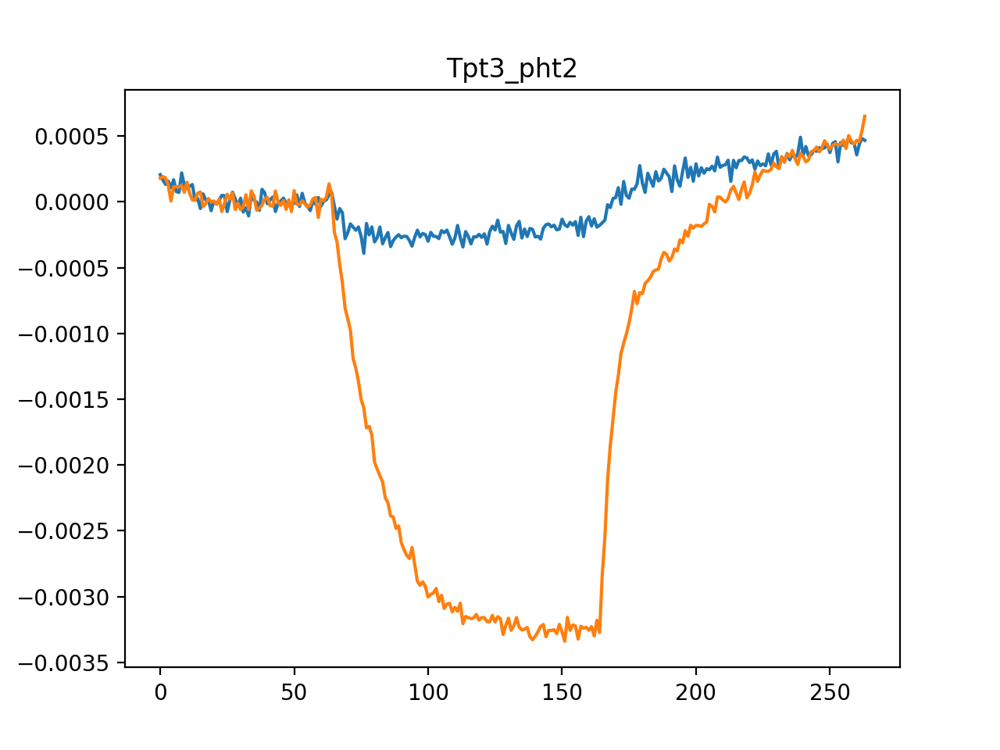

de-burning
[ 1.13911267e+00 -2.98954340e-02  4.78421908e-04]
[ 6.58320867e+00 -4.63015345e-03  4.28067352e-04]


<IPython.core.display.Javascript object>


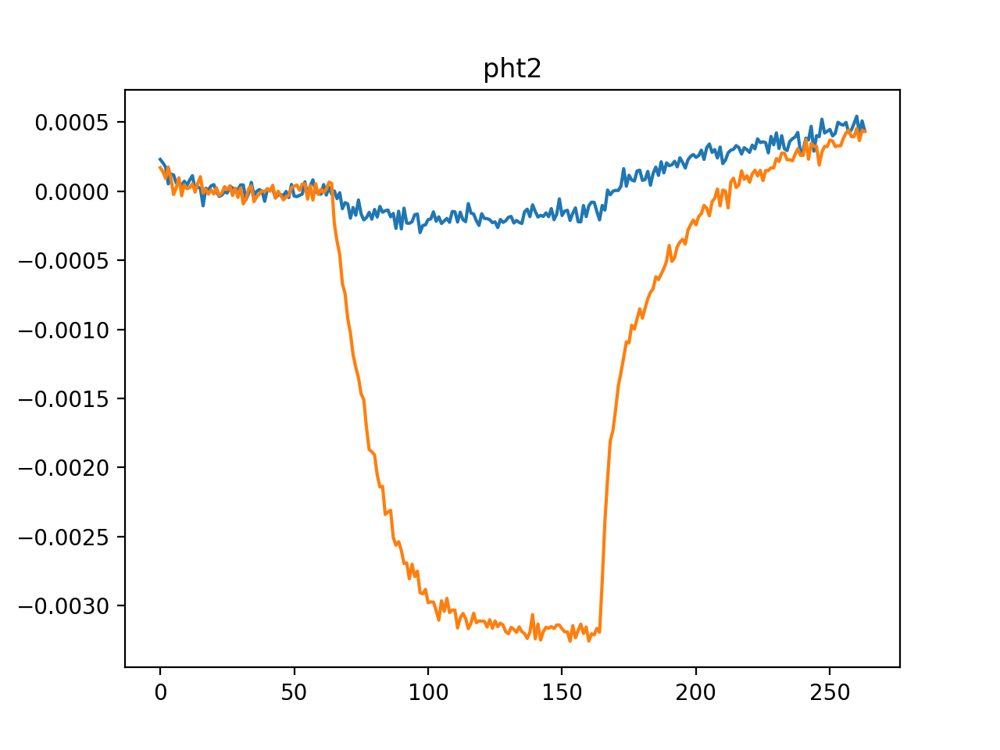

de-burning
[ 1.04357803e+00 -3.02010335e-02  4.42778868e-04]
[ 1.48116274e+01 -1.89821215e-03  3.94827837e-04]


<IPython.core.display.Javascript object>


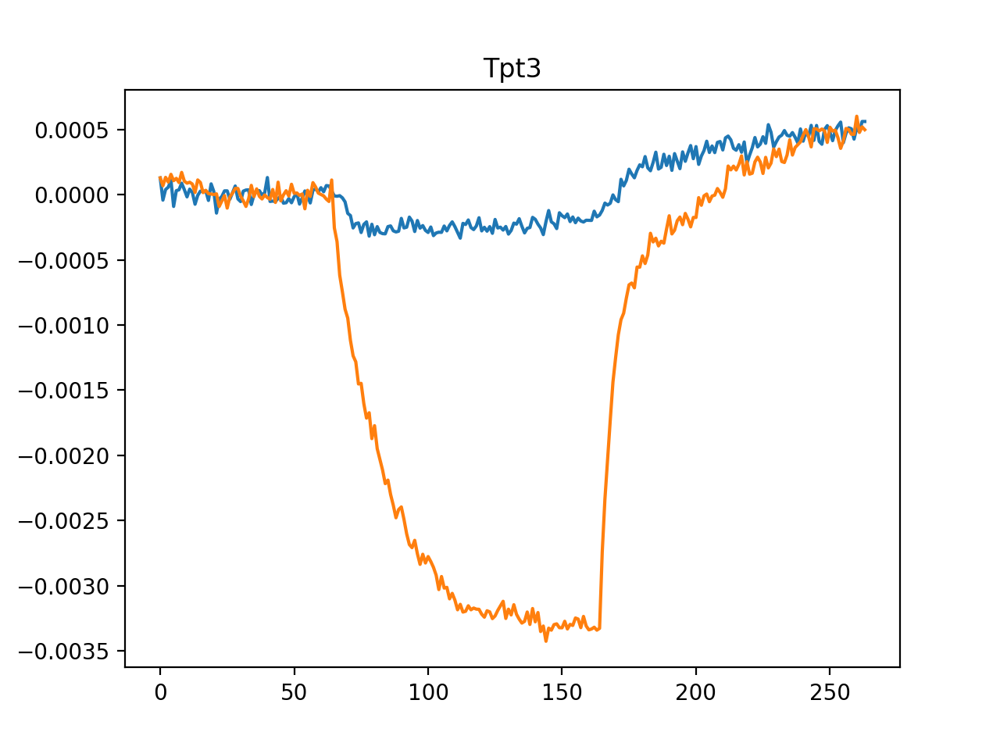

de-burning
[ 6.64543200e+00 -3.79104407e-03  3.53797911e-04]
[ 8.86124130e+00 -3.44206163e-03  4.28335971e-04]


<IPython.core.display.Javascript object>


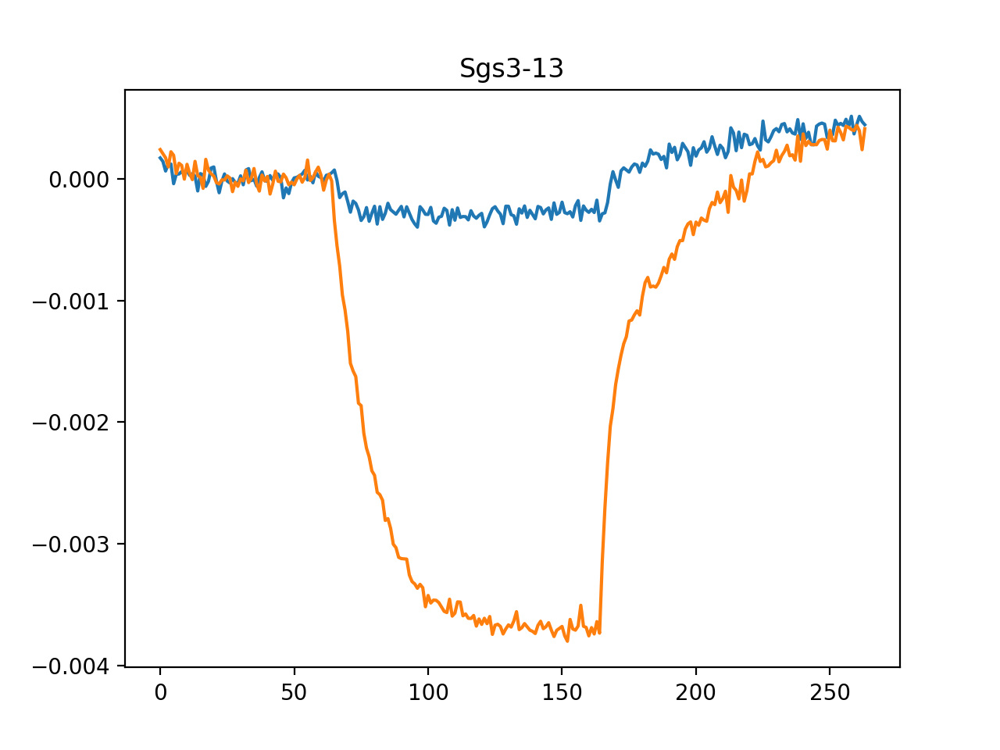

de-burning
[ 5.40690824e+00 -4.80100306e-03  3.64553291e-04]
[ 1.18878993e+01 -2.74726351e-03  4.58642309e-04]


In [18]:
# dirk_trace

# project_DF['data'][index]['520_rDA'][trace_index]

for i, index in enumerate(project_DF.index):
    project_DF['data'][index]['520_bcor'] = 0
    project_DF['data'][index]['520_bcor'] = project_DF['data'][index]['520_bcor'].astype('object')
    name = project_DF['name'][index]
    if ('paper' not in name):

        plt.figure()

        plt.title(name)

        traces_DF = project_DF['data'][index]
        dirk_traces = traces_DF[traces_DF['trace_label'] == 'dirk']
    
        ###need to change numbers depends on protocol 
        Ipy.burnCorrection(dirk_traces, [520], '_rDA', [50,99])
        for trace_index in dirk_traces.index:
            plt.plot(dirk_traces['520_bcor'][trace_index][35:])
            project_DF['data'][index]['520_bcor'][trace_index] = dirk_traces['520_bcor'][trace_index]
    plt.show()

<IPython.core.display.Javascript object>


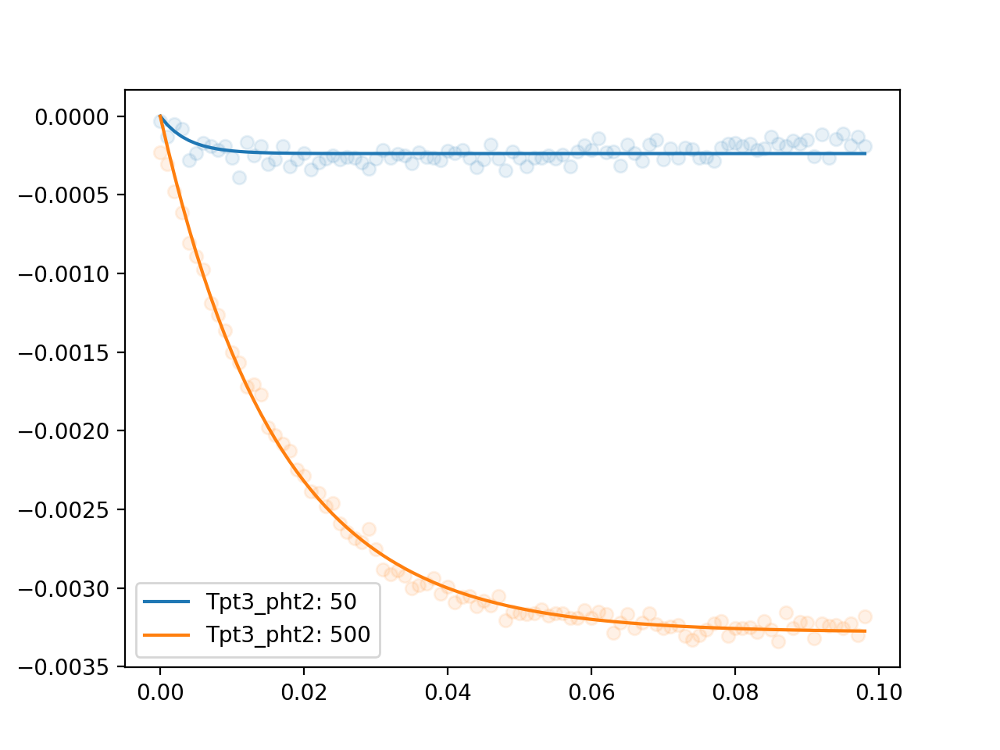

Tpt3_pht2 50: [2.37274624e-04 3.80443900e-03 2.44384627e-05 3.20311791e+01], r2 =0.19578068412932104
Tpt3_pht2 500: [3.28251967e-03 1.62805578e-02 4.07763684e-10 8.93464880e+00], r2 =0.9951504309382961


<IPython.core.display.Javascript object>


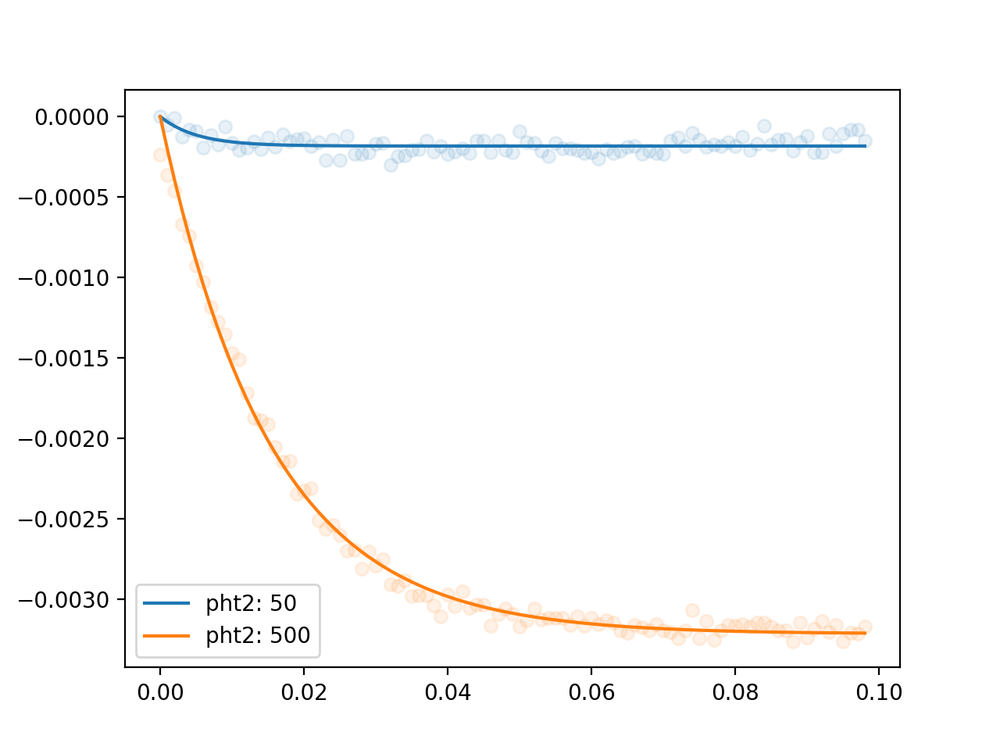

pht2 50: [1.82627012e-04 5.07569475e-03 1.78958947e-10 5.12526156e+02], r2 =0.2968927739544551
pht2 500: [3.21439705e-03 1.52317992e-02 9.18089634e-10 8.19190948e+00], r2 =0.993945434388213


<IPython.core.display.Javascript object>


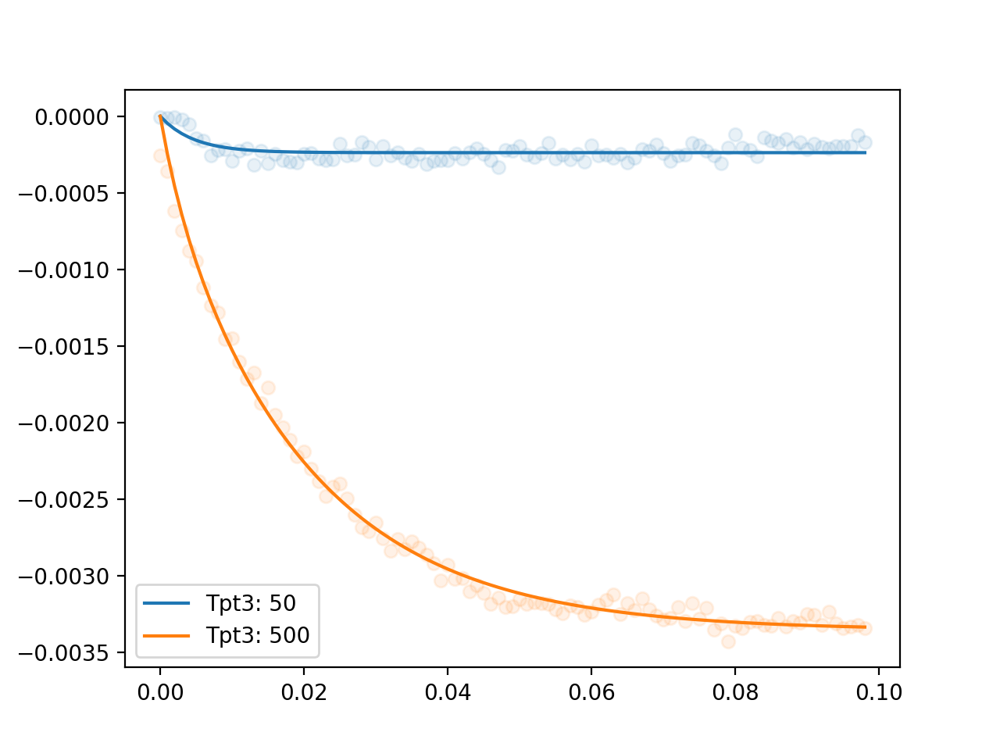

Tpt3 50: [2.37609534e-04 4.62871494e-03 6.15908969e-08 7.61261712e+01], r2 =0.4583911337958645
Tpt3 500: [0.00034759 0.003      0.00300818 0.01982544], r2 =0.9930309804285264


<IPython.core.display.Javascript object>


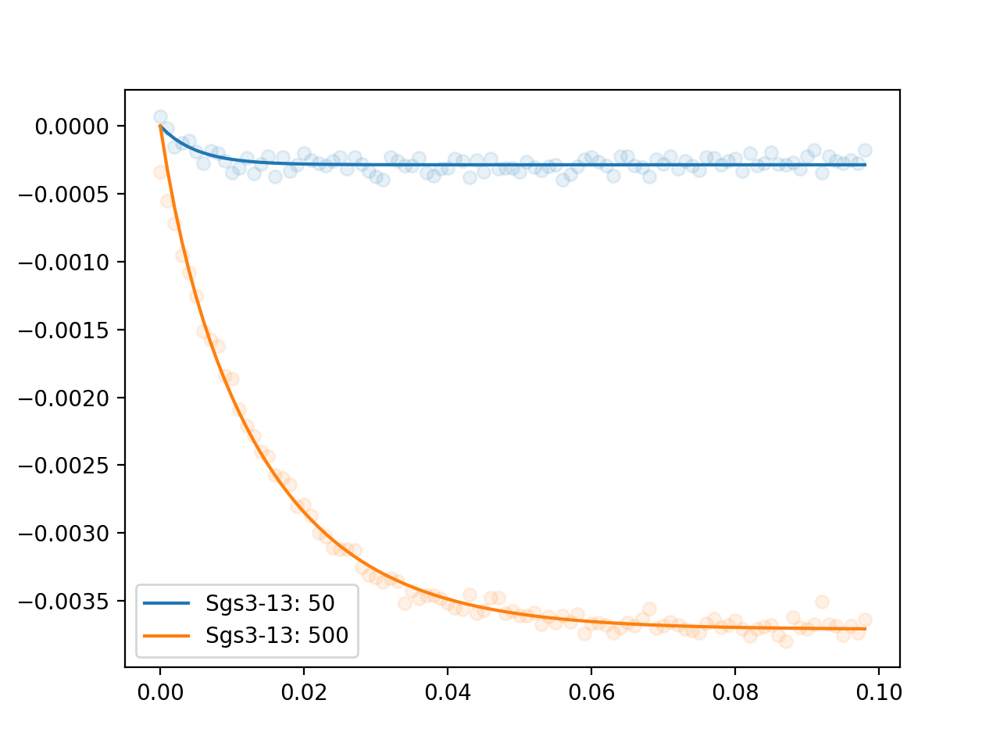

Sgs3-13 50: [2.86035540e-04 5.06831901e-03 1.95561661e-05 3.20314317e+01], r2 =0.489707984964872
Sgs3-13 500: [0.00037357 0.003      0.00333781 0.01479677], r2 =0.9929285845532253


In [19]:
#second order exponental decay
def exp_decay_neg_two_components(x, amplitude_1, tau_1, amplitude_2, tau_2): #,offset):
    return amplitude_1  * (np.exp(-np.array(x)/tau_1)-1) + amplitude_2  * (np.exp(-np.array(x)/tau_2)-1) #+ offset

col_for_fit = '520_bcor'

param_names_sc = ["amplitude_1","tau_1", "amplitude_2", "tau_2"]

for i, index in enumerate(project_DF.index):
    
    name = project_DF['name'][index] # name
    if ('paper' not in name):
        plt.figure()
        traces_DF = project_DF['data'][index]
        dirk_traces = traces_DF[traces_DF['trace_label'] == 'dirk']

        for ii, trace_index in enumerate(dirk_traces.index):
            
            dirk_trace = project_DF['data'][index][col_for_fit][trace_index]
#             dirk_traces.sort_values('start_time')

            ydata = dirk_trace[100:199] - np.mean(dirk_trace[50:99])
            #xdata = np.linspace(0,len(ydata)-1,len(ydata))
            xdata = np.linspace(0,.001*(len(ydata)-1),len(ydata))
            plt.scatter(xdata, ydata, alpha = 0.1)
            guess_offset = np.min(ydata)

            amplitude_1, tau_1, amplitude_2, tau_2, offset = 0.001, 20, 0.001,300, guess_offset

            #p0 = [amplitude_1, tau_1, amplitude_2, tau_2] #, offset
            p0 = [0.001, .008, 0.001, 1.0]

            popt, pcov = curve_fit(exp_decay_neg_two_components, xdata, ydata, p0 = p0, 
            bounds = [[0, 0.003, 0, 0.003], [np.inf, np.inf, np.inf, np.inf]])
            
            fit_y = exp_decay_neg_two_components(xdata, *popt)
            
            residuals = ydata- fit_y
            ss_res = np.sum(residuals**2)
            ss_tot = np.sum((ydata-np.mean(ydata))**2)
            r2 = 1 - (ss_res / ss_tot)
            
            PAR = project_DF['data'][index]['actinic_intensity'][trace_index]
            cor_PAR = PAR[0] * 10
            
            # save results 
            for fit_param_name,value in zip(param_names_sc,popt):
                traces_DF.loc[trace_index,fit_param_name] = value


            
            plt.plot(xdata, fit_y, label = "{}: {}".format (name, cor_PAR))
            print("{} {}: {}, r2 ={}".format(name,cor_PAR, popt,r2))
        plt.legend()
        plt.show()

<IPython.core.display.Javascript object>


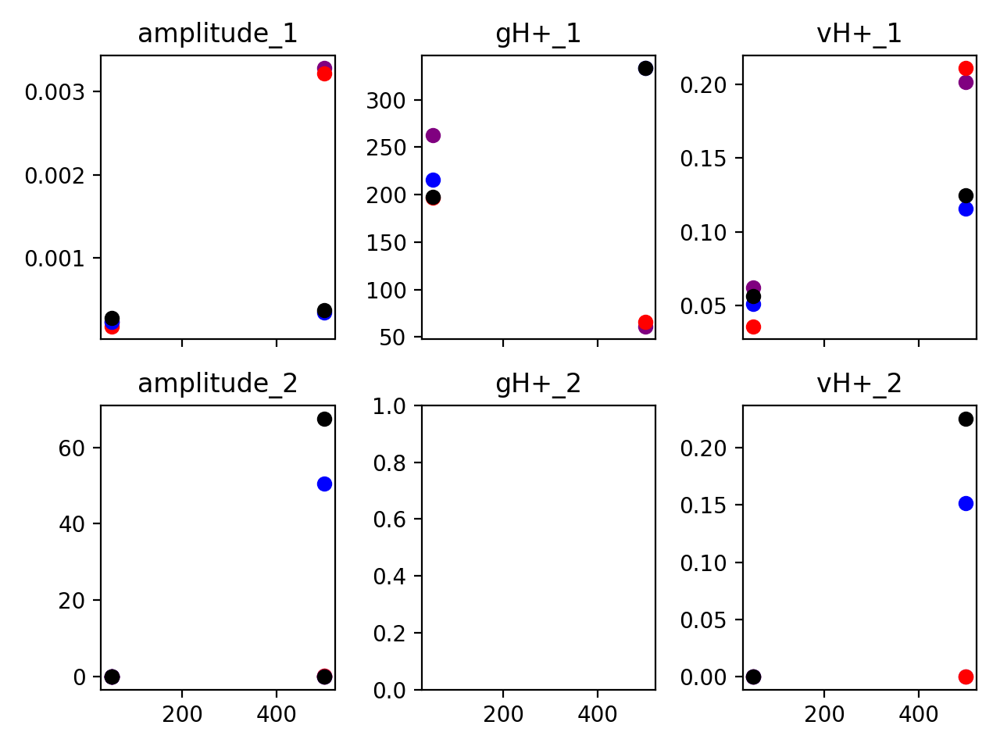

Tpt3_pht2, 50- A1:0.00023727462392926564,A2:2.4438462652027256e-05,gH+_1:262.8508435301155, gH+_2:0.03121958126937123 
Tpt3_pht2, 500- A1:0.0032825196658230037,A2:4.0776368422904577e-10,gH+_1:61.42295674478184, gH+_2:0.11192381726083228 
pht2, 50- A1:0.00018262701206544468,A2:1.7895894729690326e-10,gH+_1:197.01736412979164, gH+_2:0.001951119934519517 
pht2, 500- A1:0.003214397050755325,A2:9.180896340820489e-10,gH+_1:65.65212578758731, gH+_2:0.12207166135260887 
Tpt3, 50- A1:0.00023760953409585409,A2:6.159089692846032e-08,gH+_1:216.04268419706747, gH+_2:0.013136086891090719 
Tpt3, 500- A1:0.00034759047265415507,A2:0.0030081758813489522,gH+_1:333.33333333104207, gH+_2:50.440247722792726 
Sgs3-13, 50- A1:0.0002860355403009729,A2:1.9556166102005658e-05,gH+_1:197.3040759978595, gH+_2:0.03121933509014689 
Sgs3-13, 500- A1:0.00037356572186931245,A2:0.0033378113873759048,gH+_1:333.33333290773805, gH+_2:67.5823253107918 


In [20]:
#plt.figure()
fig, axs = plt.subplots(2, 3, sharex=True) #sharey=False)


for i, index in enumerate(project_DF.index):
    
    name = project_DF['name'][index]
    traces_DF = project_DF['data'][index]
    selected_traces = traces_DF[traces_DF['trace_label'] == 'dirk']
    

    #print(name)
    if ('paper' not in name):
        

        for trace_index in selected_traces.index:
            
            PAR = project_DF['data'][index]['actinic_intensity'][trace_index]
            cor_PAR = PAR[0] * 10
            
            A1 = traces_DF['amplitude_1'][trace_index]
            A2 = traces_DF['amplitude_2'][trace_index]
            gHplus1=1/ traces_DF['tau_1'][trace_index]
            gHplus2=1/ traces_DF['tau_2'][trace_index]
            vHplus1= A1 * gHplus1
            vHplus2= A2 * gHplus2
            
            
            #plt.scatter(cor_PAR,A1, label = name, color=colors[name])
            
            #plt.scatter(cor_PAR,gProton, label = name, color=colors[name])
            
            #print(traces_DF['amplitude'][trace_index],cor_PAR, name)
            
            axs[0, 0].scatter(cor_PAR, A1, color=colors[name], label = name)
            axs[0, 0].set_title("amplitude_1")
            #axs[0, 0].set_ylim(ymin=0)
            
            axs[1, 0].scatter(cor_PAR, A2, color=colors[name])#, label = name)
            axs[1, 0].set_title("amplitude_2")
            #axs[1, 0].set_ylim(ymin=-1)
            
                        
            axs[0, 1].scatter(cor_PAR, gHplus1, color=colors[name])#, label = name)
            axs[0, 1].set_title("gH+_1")
            
            axs[1, 0].scatter(cor_PAR, gHplus2, color=colors[name])#, label = name)
            axs[1, 1].set_title("gH+_2")
            
            axs[0, 2].scatter(cor_PAR, vHplus1, color=colors[name])#, label = name)
            axs[0, 2].set_title("vH+_1")
            
            axs[1, 2].scatter(cor_PAR, vHplus2, color=colors[name])#, label = name)
            axs[1, 2].set_title("vH+_2")
            
            print("{}, {}- A1:{},A2:{},gH+_1:{}, gH+_2:{} ".format(name,cor_PAR, A1,A2, gHplus1, gHplus2))

            plt.tight_layout()
#plt.legend()
#plt.xlim(xmin=0)    
#plt.ylim(ymin=0)  

plt.show()

<IPython.core.display.Javascript object>


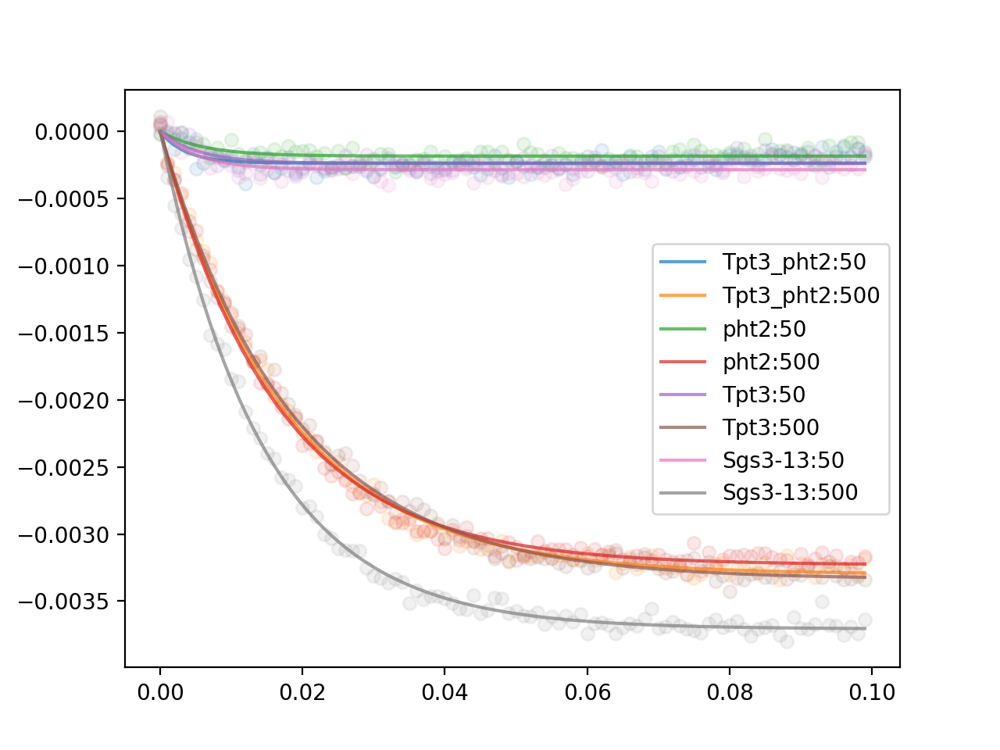

Tpt3_pht2:50, [0.00023541 0.00353979], 0.34093669899001366
:500, [0.00330157 0.0175454 ], 0.9956779318753513
pht2:50, [0.00018315 0.00611611], 0.3396270184344158
:500, [0.0032316  0.01645663], 0.9941387629111913
Tpt3:50, [0.00023764 0.00547185], 0.4994754928643478
:500, [0.00333808 0.01857602], 0.9951611167355935
Sgs3-13:50, [0.00028482 0.00538868], 0.5512067951234396
:500, [0.00370751 0.01439069], 0.9964636678540184


In [21]:
#first order exponental decay
def exp_decay_neg(x, amplitude, tau):
    return amplitude  * (np.exp(-np.array(x)/tau)-1)

# labels for convenience when we save the fit parameters
param_names = ["amplitude","tau"]
plt.figure()


col_for_fit = '520_bcor'
for i, index in enumerate(project_DF.index):
   
    name = project_DF['name'][index] # name
    if ('paper' not in name):
        traces_DF = project_DF['data'][index]
        dirk_traces = traces_DF[traces_DF['trace_label'] == 'dirk']

#         Ipy.recalcAbsUsingPointsFromI_selected_indexes(project_DF['data'][index], 
#                             ['520'], I0_points = [95,99], indexes = dirk_traces.index)


        for ii, trace_index in enumerate(dirk_traces.index):

            if (ii == 0):
                label = name
            else:
                label = ""

            dirk_trace = project_DF['data'][index][col_for_fit][trace_index]
            dirk_traces.sort_values('start_time')

            #ydata = dirk_trace[300:1199]
            ydata = dirk_trace[99:199] - np.mean(dirk_trace[50:99])
            xdata = np.linspace(0,.001*(len(ydata)-1),len(ydata))
            fit_params, stats_parms = curve_fit(exp_decay_neg, xdata, ydata)


            # amplitude, tau = fit_params
            # fit_y = exp_decay_neg(xdata, amplitude, tau)

            fit_y = exp_decay_neg(xdata, *fit_params)
            residuals = ydata - fit_y
            ss_res = np.sum(residuals**2)
            ss_tot = np.sum((ydata - np.mean(ydata))**2)
            r2 = 1- (ss_res / ss_tot)

            
            PAR = project_DF['data'][index]['actinic_intensity'][trace_index]
            cor_PAR = PAR[0] * 10
            # save results 
            for fit_param_name,value in zip(param_names,fit_params):
                traces_DF.loc[trace_index,fit_param_name] = value

            plt.scatter(xdata,ydata, alpha=0.1)# label = label)

            #plt.plot(xdata, fit_y, color = color,alpha=0.5, label ="r-squared:" + str(r2))
            plt.plot(xdata, fit_y, alpha=0.7,label=name +':'+ str(cor_PAR))
            print(label + ":{}, {}, {}".format(cor_PAR,fit_params,r2))
                  #+'fit: a=%5.4f, tau=%5.3f' % tuple(fit_params) + ", r-squared:%1.4f" % r2)
            #plt.plot(xdata, residuals, color = color,alpha=0.5)


            plt.legend()
    plt.show()
    #print(traces_DF.keys())

<IPython.core.display.Javascript object>


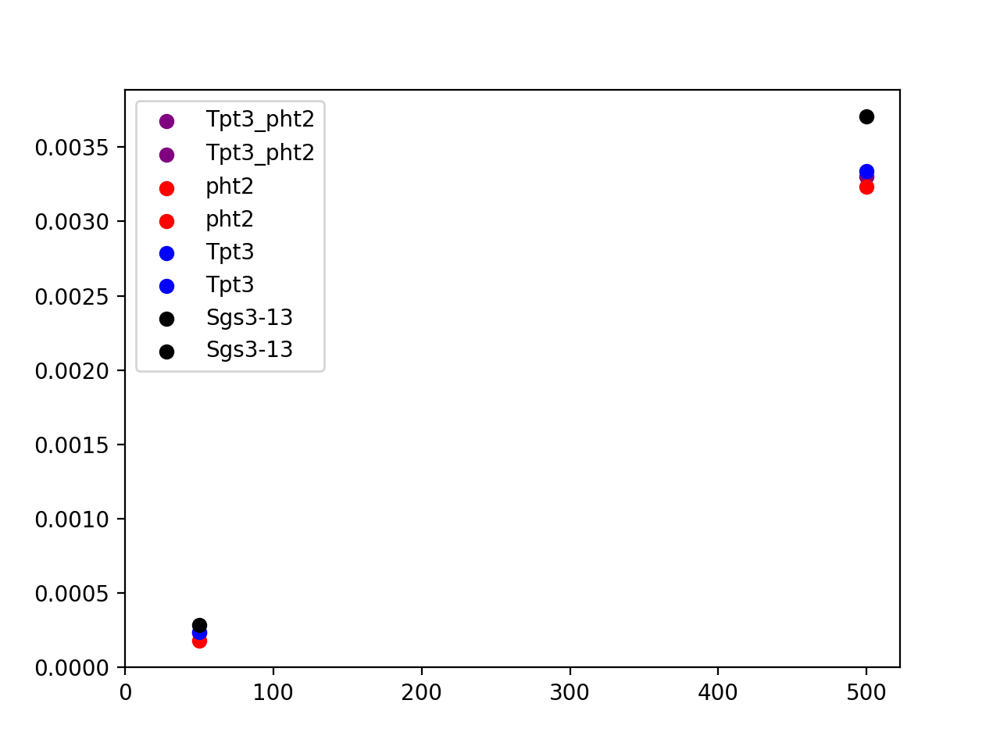

In [22]:
#first order exponental decay results for one plot
plt.figure()

    

for i, index in enumerate(project_DF.index):
    
    name = project_DF['name'][index]
    traces_DF = project_DF['data'][index]
    selected_traces = traces_DF[traces_DF['trace_label'] == 'dirk']
    

    #print(name)
    if ('paper' not in name):
        

        for trace_index in selected_traces.index:
            
            PAR = project_DF['data'][index]['actinic_intensity'][trace_index]
            A = traces_DF['amplitude'][trace_index]
            gProton =1/ traces_DF['tau'][trace_index]
            cor_PAR = PAR[0] * 10
            plt.scatter(cor_PAR,A, label = name, color=colors[name])
            #plt.scatter(cor_PAR,gProton, label = name, color=colors[name])
            A = traces_DF['amplitude'][trace_index]
            gHplus =1/ traces_DF['tau'][trace_index]
            vHplus= A * gHplus
            

plt.xlim(xmin=0)    
plt.ylim(ymin=0)  
plt.legend()


plt.show()

<IPython.core.display.Javascript object>


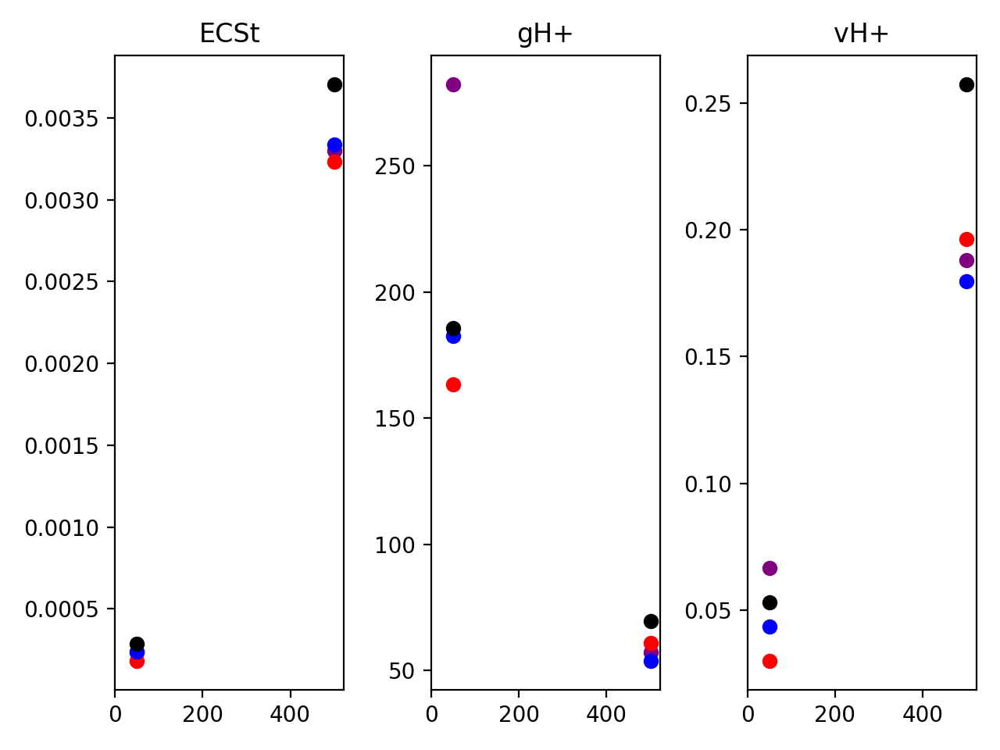

In [23]:
#first order exponental decay results for multiple subplots

fig, (ax1,ax2,ax3) = plt.subplots(1, 3, sharex=True) #sharey=False)

for i, index in enumerate(project_DF.index):
    
    name = project_DF['name'][index]
    traces_DF = project_DF['data'][index]
    selected_traces = traces_DF[traces_DF['trace_label'] == 'dirk']
    

    #print(name)
    if ('paper' not in name):
        

        for trace_index in selected_traces.index:
            
            PAR = project_DF['data'][index]['actinic_intensity'][trace_index]
            cor_PAR = PAR[0] * 10
            
            A = traces_DF['amplitude'][trace_index]
            gHplus =1/ traces_DF['tau'][trace_index]
            vHplus= A * gHplus
            
            ax1.scatter(cor_PAR, A , color=colors[name])
            ax1.set_title("ECSt")
            #ax1.set_ylim(0,0.003)

            ax2.scatter(cor_PAR, gHplus, color=colors[name], label = name)
            ax2.set_title("gH+")
            #ax2.set_ylim(0,50)
            
            ax3.scatter(cor_PAR, vHplus, color=colors[name], label = name)
            ax3.set_title("vH+")
            #ax3.set_ylim(0,0.05)
            #plt.scatter(cor_PAR, A, color=colors[name], label = name)
            #print(traces_DF['amplitude'][trace_index],cor_PAR, name)
            plt.tight_layout()
plt.xlim(xmin=0)    
#plt.ylim(ymin=0)  
#plt.legend()
plt.show()

<IPython.core.display.Javascript object>


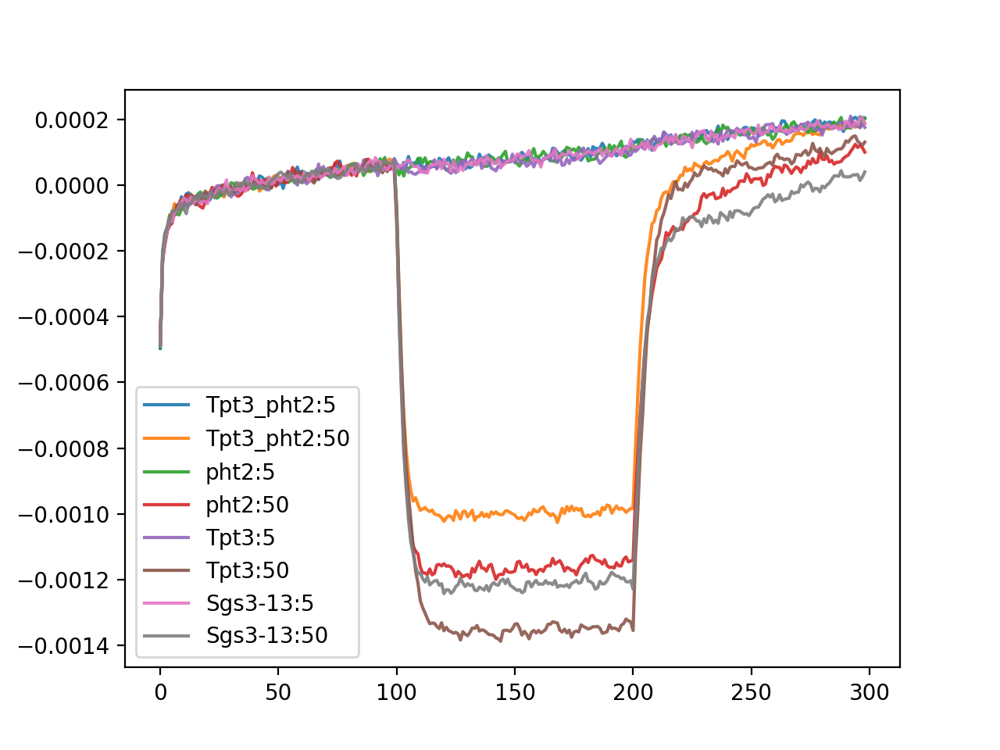

In [24]:
##p700 plotting

plt.figure()
for i, index in enumerate(project_DF.index):
    
    name = project_DF['name'][index]
    if ('paper' not in name):
        traces_DF = project_DF['data'][index]
        p700_dirk_traces = traces_DF[traces_DF['trace_label'] == '810dirk']


        # the following recalculates the absrobance data using I0_points
        # and stores the values in columns ending with '_rDA'

        Ipy.recalcAbsUsingPointsFromI_selected_indexes(project_DF['data'][index], 
                         ['810','940'], I0_points = [0,100], indexes = p700_dirk_traces.index)


        dirk_traces.sort_values('start_time')
        for ii, trace_index in enumerate(p700_dirk_traces.index):
            #if (ii == 0):
        
#             label = name
#         else:
#             label = ""
            label = name
            PAR = project_DF['data'][index]['actinic_intensity'][trace_index]
    #         if (PAR[0] >30):
    #             print(PAR)
    #             print(PAR, trace_index)
            p700_dirk_traces = project_DF['data'][index]['810_rDA'][trace_index]
            x = np.arange(0,len(p700_dirk_traces),1)
        
            #plt.scatter(x,p700_dirk_traces, alpha=0.5)#, label = label) #color = cm.jet(i/len(project_DF.index))
            plt.plot(x,p700_dirk_traces, alpha=0.9,label = label + ":" + str(PAR[0]),)
    plt.legend()
    plt.show()
    

<IPython.core.display.Javascript object>


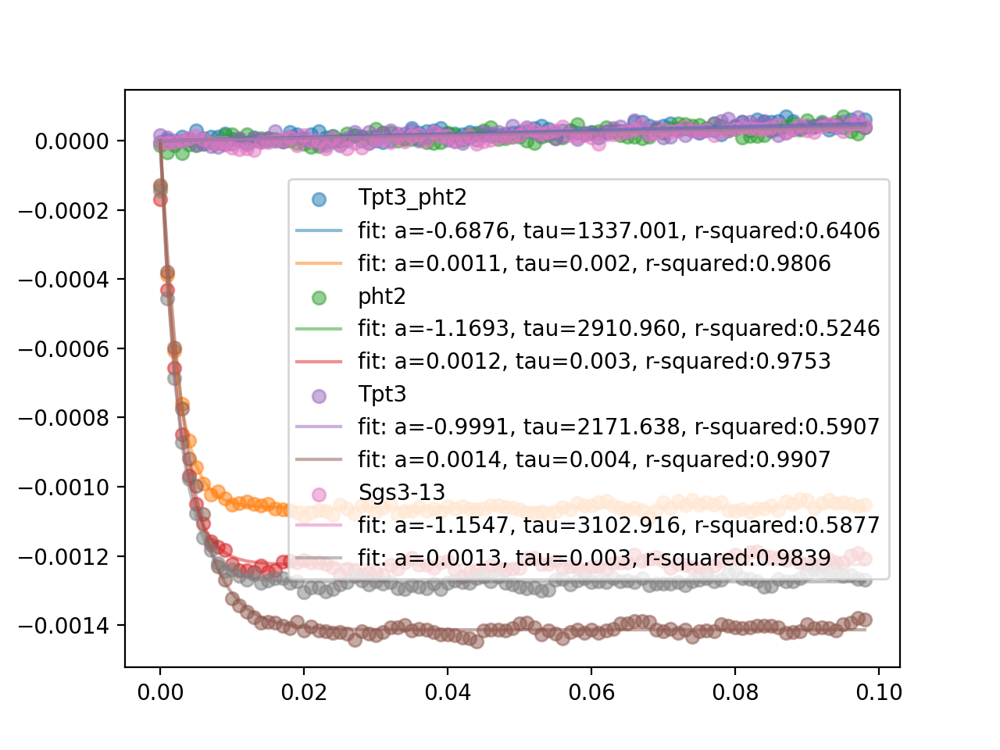

In [25]:
##############p700 fitting

def exp_decay_neg(x, amplitude, tau):
    return amplitude  * (np.exp(-np.array(x)/tau)-1)

p700_param_names = ["p700_amplitude","p700_tau"]

plt.figure()



# for DF_index in project_DF.index:    # go through each exp. in the df
#     this_exp_data = project_DF['data'][DF_index]  ## get the experimental df
#     name = project_DF['name'][DF_index]
#     if ('paper' not in name):
#         plt.figure()
#         plt.title(name)
#     selected_traces = this_exp_data[this_exp_data['trace_label']== '810_dirk']

#     project_DF['data'][DF_index]['p700_amp'] = 0
#     project_DF['data'][DF_index]['p700_tau'] = 0
    
    
    


# labels for convenience when we save the fit parameters

for i, index in enumerate(project_DF.index):
   
    name = project_DF['name'][index] # name
    if ('paper' not in name):
        traces_DF = project_DF['data'][index]
        p700_dirk_traces = traces_DF[traces_DF['trace_label'] == '810dirk']

        Ipy.recalcAbsUsingPointsFromI_selected_indexes(project_DF['data'][index], 
                            ['810'], I0_points = [90,99], indexes = p700_dirk_traces.index)##?


        for ii, trace_index in enumerate(p700_dirk_traces.index):

            if (ii == 0):
                label = name
            else:
                label = ""

            dirk_trace = project_DF['data'][index]['810_rDA'][trace_index]
            dirk_traces.sort_values('start_time')

            ydata = dirk_trace[100:199]
            xdata = np.linspace(0,.001*(len(ydata)-1),len(ydata))
            fit_params, stats_parms = curve_fit(exp_decay_neg, xdata, ydata)


            # amplitude, tau = fit_params
            # fit_y = exp_decay_neg(xdata, amplitude, tau)

            fit_y = exp_decay_neg(xdata, *fit_params)
            residuals = ydata - fit_y
            ss_res = np.sum(residuals**2)
            ss_tot = np.sum((ydata - np.mean(ydata))**2)
            r2 = 1- (ss_res / ss_tot)

            # save results 
            for fit_param_name,value in zip(p700_param_names,fit_params):
                traces_DF.loc[trace_index,fit_param_name] = value

            plt.scatter(xdata,ydata, alpha=0.5, label = label)

            #plt.plot(xdata, fit_y, color = color,alpha=0.5, label ="r-squared:" + str(r2))
            plt.plot(xdata, fit_y,alpha=0.5,
              label='fit: a=%5.4f, tau=%5.3f' % tuple(fit_params) + ", r-squared:%1.4f" % r2)
            #plt.plot(xdata, residuals, color = color,alpha=0.5)


            plt.legend()
    plt.show()
    #print(traces_DF.keys())



<IPython.core.display.Javascript object>


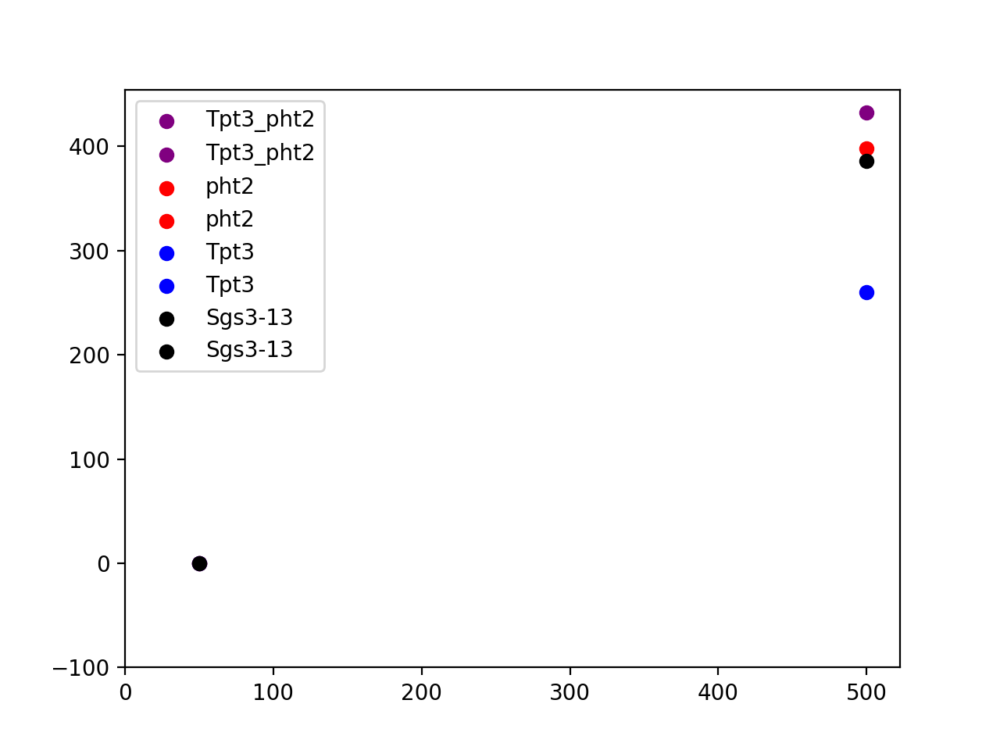

In [26]:
# p700 data - first order exponental decay results for one plot 
plt.figure()

for i, index in enumerate(project_DF.index):
    
    name = project_DF['name'][index]
    traces_DF = project_DF['data'][index]
    selected_traces = traces_DF[traces_DF['trace_label'] == '810dirk']
    

    #print(name)
    if ('paper' not in name):
        

        for trace_index in selected_traces.index:
            
            PAR = project_DF['data'][index]['actinic_intensity'][trace_index]
            #P700_A = traces_DF['p700_amplitude'][trace_index]
            kb6f =1/ traces_DF['p700_tau'][trace_index]
            cor_PAR = PAR[0] * 10
            plt.scatter(cor_PAR,kb6f, label = name, color=colors[name])
            #plt.scatter(cor_PAR,gProton, label = name, color=colors[name])
            
            #print(traces_DF['p700_A'][trace_index],cor_PAR, name)
    
plt.xlim(xmin=0)    
plt.ylim(ymin=-100)  
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


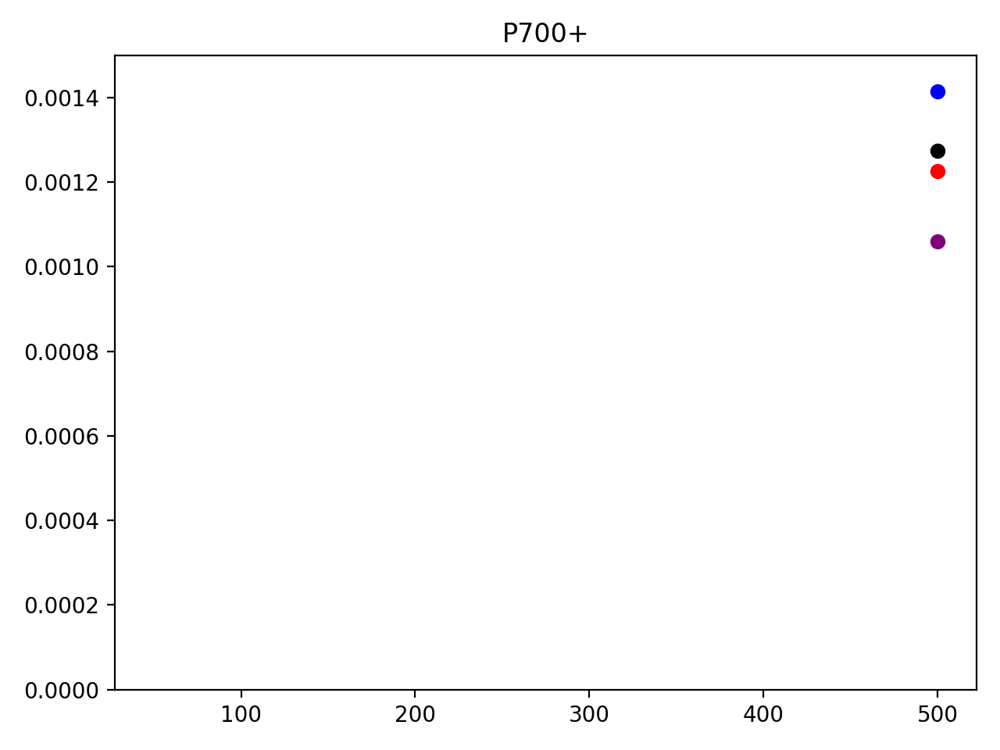

50 -0.6875816278825965
500 0.0010602236106301906
50 -1.1693477054853838
500 0.0012250488669155594
50 -0.9991064394853171
500 0.0014137174931867357
50 -1.1546749583456974
500 0.0012746136088615072


In [28]:
# p700 data - first order exponental decay results for multiple subplots
##fig, (ax1,ax2) = plt.subplots(1, 2, sharex=True) #sharey=False)
fig, (ax1) = plt.subplots(1, sharex=True) #sharey=False)

for i, index in enumerate(project_DF.index):
    
    name = project_DF['name'][index]
    traces_DF = project_DF['data'][index]
    selected_traces = traces_DF[traces_DF['trace_label'] == '810dirk']
    

    #print(name)
    if ('paper' not in name):
        

        for trace_index in selected_traces.index:
            
            PAR = project_DF['data'][index]['actinic_intensity'][trace_index]
            cor_PAR = PAR[0] * 10
            P700_A = traces_DF['p700_amplitude'][trace_index]
            print(cor_PAR,P700_A)
            ax1.scatter(cor_PAR, P700_A , color=colors[name])
            ax1.set_title("P700+")
            ax1.set_ylim(0,0.0015)
       
        #for trace_index in selected_traces.index:
            
            #PAR = project_DF['data'][index]['actinic_intensity'][trace_index]
            #cor_PAR = PAR[0] * 10
            #kb6f =1/ traces_DF['p700_tau'][trace_index]

            #ax2.scatter(cor_PAR, kb6f, color=colors[name], label = name)
            #ax2.set_title("kb6f")
            #ax1.set_ylim(-0.5,500)

            plt.tight_layout()
#plt.xlim(xmin=0)    
#plt.ylim(ymin=0, ymax=2)  
#plt.legend()
plt.show()

In [4]:
wls = [505, 520, 535]
seleted_protocol_label = 'lirk_parsing'

# plot_these = [' 1', ' 2', ' 3']

plot_these = {'505': 'cyan', 
              '520': 'green', 
              '535' : 'orange'}
for i, index in enumerate(project_DF.index):
    
    traces_DF = project_DF['data'][index]
    
    
    
    selected_traces = traces_DF[traces_DF['trace_label'] == seleted_protocol_label]
    selected_traces.sort_values('start_time')
    
    Ipy.recalcAbsUsingPointsFromI_selected_indexes(project_DF['data'][index], 
                    wls, I0_points = [50,100], indexes = selected_traces.index)
    
    
    if (0):
        plt.figure()

        name = project_DF['name'][index]
        plt.title(name)
        for plot_this in plot_these.keys():
            time_index_start = 0

            for trace_index in selected_traces.index:



                trace = project_DF['data'][index][plot_this + '_I'][trace_index]

                smoothedTrace = savgol_filter(trace , 11, 3)

                time_index = np.linspace(time_index_start, time_index_start + len(trace)-1, len(trace))
                time_index_start = time_index_start + len(trace)

                plt.plot(time_index, trace, color = plot_these[plot_this], alpha=0.2)
                plt.plot(time_index, smoothedTrace, color = plot_these[plot_this])
        plt.show()
    



NameError: name 'project_DF' is not defined

In [78]:
for index in project_DF.index:
    
    traces_DF = project_DF['data'][index]
    traces_DF['modified_protocol_label'] = traces_DF['protocol_label']
    
    selected_traces = traces_DF[traces_DF['protocol_label'] == 'lirk_parsing']
    selected_traces.sort_values('start_time')
    
    for selected_index in selected_traces.index:
        if (traces_DF.loc[selected_index, 'actinic_intensity'][0] > 0):
            project_DF['data'][index].loc[selected_index, 'modified_protocol_label'] = 'lirk_parsing_decay'
        else:
            project_DF['data'][index].loc[selected_index, 'modified_protocol_label'] = 'lirk_parsing_induction'

# selected_traces = selected_traces[selected_traces['protocol_label'] == 'lirk_parsing']


In [79]:
# for index in project_DF.index:
#     print(project_DF['data'][index]['modified_protocol_label'])

In [80]:
def fit_burn(x, drift_amplitude, tau, offset):
    
    """
        Function for fitting absorbance traces to a funciton to account for 
        I will fit the baseline with a hyperbolic or exponential
        
        a is the amplitude of the burn-in
        b is the time constant
        c is the offset

    """

    fit_burn = offset + drift_amplitude/(1 + x / tau)
    return (fit_burn)

def fit_burn_two_components(x, drift_amplitude_1, tau_1, drift_amplitude_2, tau_2, offset):
    
    """
        Function for fitting absorbance traces to a funciton to account for 
        I will fit the baseline with a hyperbolic or exponential
        
        a is the amplitude of the burn-in
        b is the time constant
        c is the offset

    """

    fit_burn = offset + drift_amplitude_1/(1 + x / tau_1) + + drift_amplitude_2/(1 + x / tau_2)
    return (fit_burn)

wls = [505]



<IPython.core.display.Javascript object>


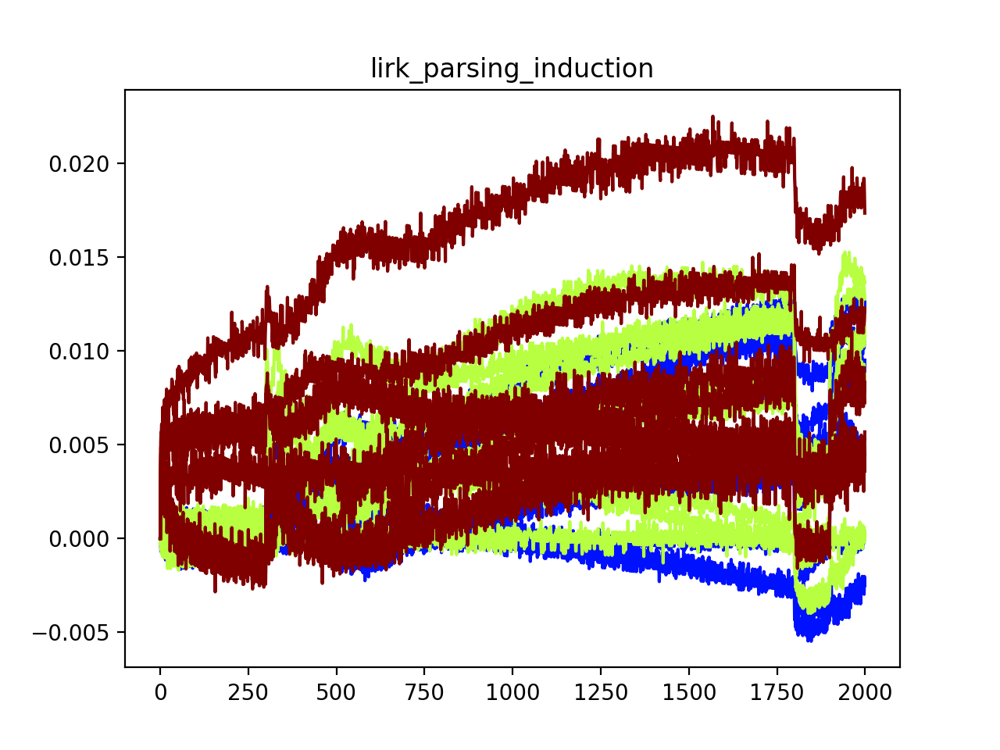

<IPython.core.display.Javascript object>


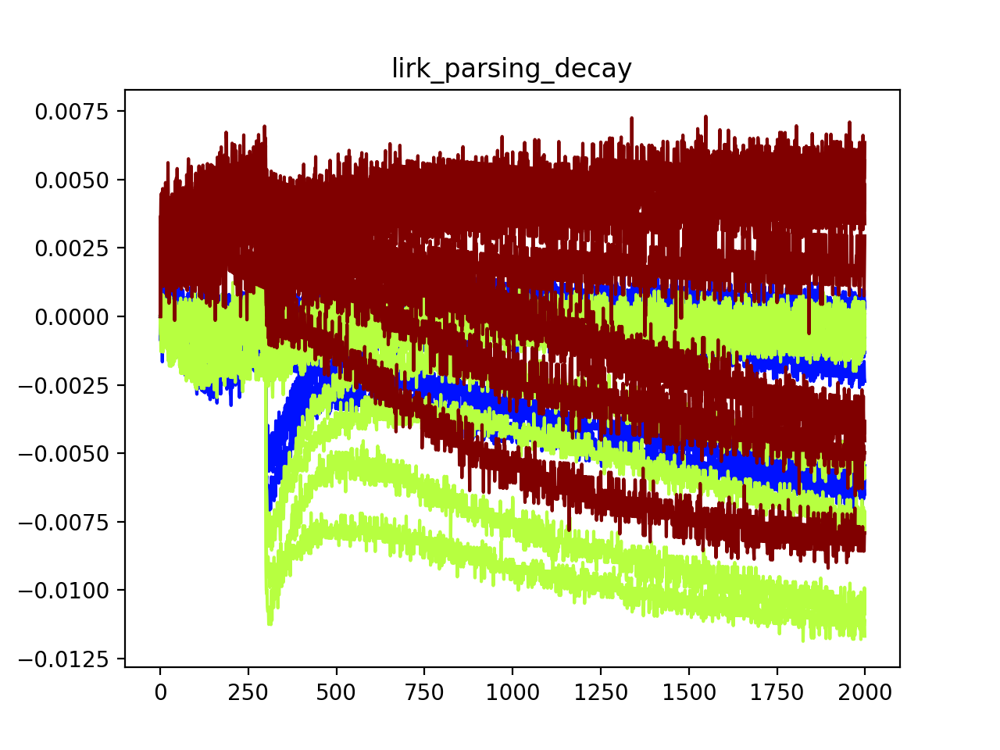

In [81]:
wls = [505, 520, 535]

# select the experiment name for the burn corrections

burn_corrections_experiment_name = 'paper1'

burn_ref_traces = project_DF[project_DF['name'] == burn_corrections_experiment_name]
burn_ref_traces_index = burn_ref_traces.index[0]

#enter a list of modified_protocol_label entries to fit burn corrections:

modified_protocol_labels = ['lirk_parsing_induction', 'lirk_parsing_decay']

# make a new column to store the burn in correction traces

for target_DF_index in project_DF.index:
    for wl in wls:
        project_DF['data'][target_DF_index]['burn_in_correction_baseline_' + str(wl)] = 0
        project_DF['data'][target_DF_index]['burn_in_correction_baseline_' + str(wl)] = project_DF['data'][target_DF_index]['burn_in_correction_baseline_' + str(wl)].astype('object')
        project_DF['data'][target_DF_index]['deltaA_cor_' + str(wl)] = 0
        project_DF['data'][target_DF_index]['deltaA_cor_' + str(wl)] = project_DF['data'][target_DF_index]['deltaA_cor_' + str(wl)].astype('object')


for modified_protocol_label in modified_protocol_labels:
    plt.figure()
#      find all selected traces with the modified_protocol_label
    selected_traces = project_DF['data'][burn_ref_traces_index]
    selected_traces = selected_traces[selected_traces['modified_protocol_label'] == modified_protocol_label]
    
#     selected_traces['actinic_intensity']
    plt.title(modified_protocol_label)
    for wl in wls:
        for index in selected_traces.index:
            y = selected_traces[str(wl) + '_I'][index]

            x = np.linspace(0,len(y)-1, len(y))

            guess_offset = np.max(y) # start with the max amplitude of the yvalues

            drift_amplitude_1, tau_1, drift_amplitude_2, tau_2, offset = 0.01, 20, 0.01, 300, guess_offset

            p0 = [drift_amplitude_1, tau_1, drift_amplitude_2, tau_2, offset]

            popt, pcov = curve_fit(fit_burn_two_components, x, y, p0 = p0, bounds = [[0, 0, 0, 0, 0], 
                                                                                     [np.inf, np.inf, np.inf, np.inf, np.inf]])

            sim_y = np.array(fit_burn_two_components(x, *popt))
            sim_y = sim_y/sim_y[0]

            for target_DF_index in project_DF.index:
                target_selected_traces = project_DF['data'][target_DF_index][project_DF['data'][target_DF_index]['modified_protocol_label'] == modified_protocol_label]
                for target_trace_index in target_selected_traces.index:
                    project_DF['data'][target_DF_index]['burn_in_correction_baseline_' + str(wl)][target_trace_index] = sim_y
                    
                    y = np.array(target_selected_traces[str(wl) + '_I'][target_trace_index])
                    y = y/y[0]
                    delta_A_corr = np.log(sim_y/y)
                    project_DF['data'][target_DF_index]['deltaA_cor_' + str(wl)][target_trace_index] = delta_A_corr
                    plt.plot(delta_A_corr, color = cm.jet((wl - 500)/35))
    plt.show()

In [82]:
# for c in project_DF['data'][0].columns:
#     if ('cor' in c):
#         print(c)

<IPython.core.display.Javascript object>


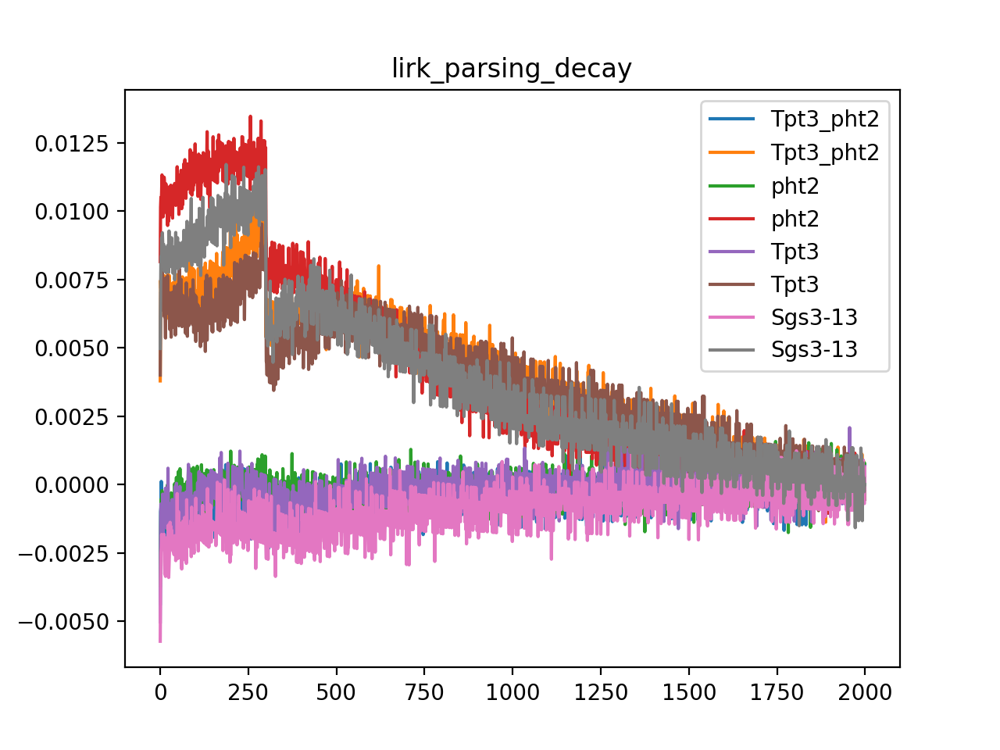

In [83]:
wls = [505, 520, 535]

seleted_protocol_labels = ['lirk_parsing_decay']

# plot_these = [' 1', ' 2', ' 3']

plot_these = ['deltaA_cor_535']


for seleted_protocol_label in seleted_protocol_labels:
    plt.figure()
    plt.title(seleted_protocol_label)
    for index in project_DF.index:

        name = project_DF['name'][index]
        if ('paper' not in name):
            traces_DF = project_DF['data'][index]



            selected_traces = traces_DF[ traces_DF ['modified_protocol_label'] == seleted_protocol_label]
            selected_traces.sort_values('start_time')

            for plot_this in plot_these:
                time_index_start = 0

                for trace_index in selected_traces.index:



                    trace = np.array(project_DF['data'][index][plot_this][trace_index])
                    trace = trace - np.mean(trace[-20:])
                    plt.plot(trace, label = name)

    #             time_index = np.linspace(time_index_start, time_index_start + len(trace)-1, len(trace))
    #             time_index_start = time_index_start + len(trace)

    #             plt.plot(time_index, trace, color = plot_these[plot_this], alpha=0.2)
    #             plt.plot(time_index, smoothedTrace, color = plot_these[plot_this])
        plt.legend()
        plt.show()


<IPython.core.display.Javascript object>


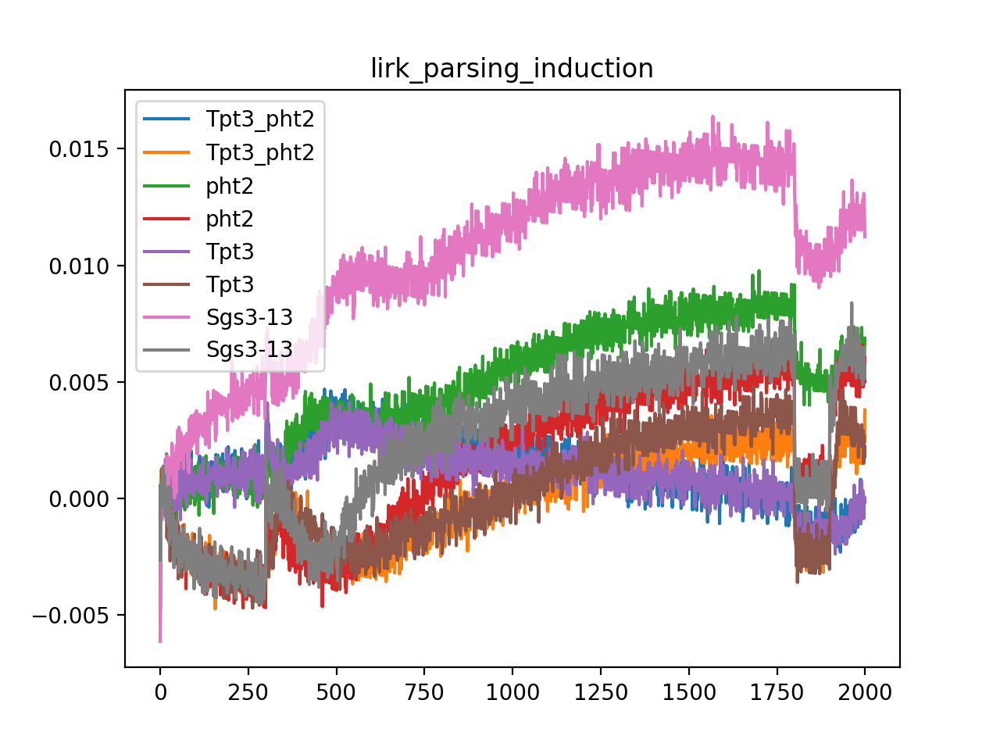

In [84]:
wls = [505, 520, 535]

seleted_protocol_labels = ['lirk_parsing_induction']

# plot_these = [' 1', ' 2', ' 3']

plot_these = ['deltaA_cor_535']


for seleted_protocol_label in seleted_protocol_labels:
    plt.figure()
    plt.title(seleted_protocol_label)
    for index in project_DF.index:

        name = project_DF['name'][index]
        if ('paper' not in name):
            traces_DF = project_DF['data'][index]



            selected_traces = traces_DF[ traces_DF ['modified_protocol_label'] == seleted_protocol_label]
            selected_traces.sort_values('start_time')

            for plot_this in plot_these:
                time_index_start = 0

                for trace_index in selected_traces.index:



                    trace = np.array(project_DF['data'][index][plot_this][trace_index])
                    trace = trace - np.mean(trace[0:20])
                    plt.plot(trace, label = name)

    #             time_index = np.linspace(time_index_start, time_index_start + len(trace)-1, len(trace))
    #             time_index_start = time_index_start + len(trace)

    #             plt.plot(time_index, trace, color = plot_these[plot_this], alpha=0.2)
    #             plt.plot(time_index, smoothedTrace, color = plot_these[plot_this])
        plt.legend()
        plt.show()


<IPython.core.display.Javascript object>


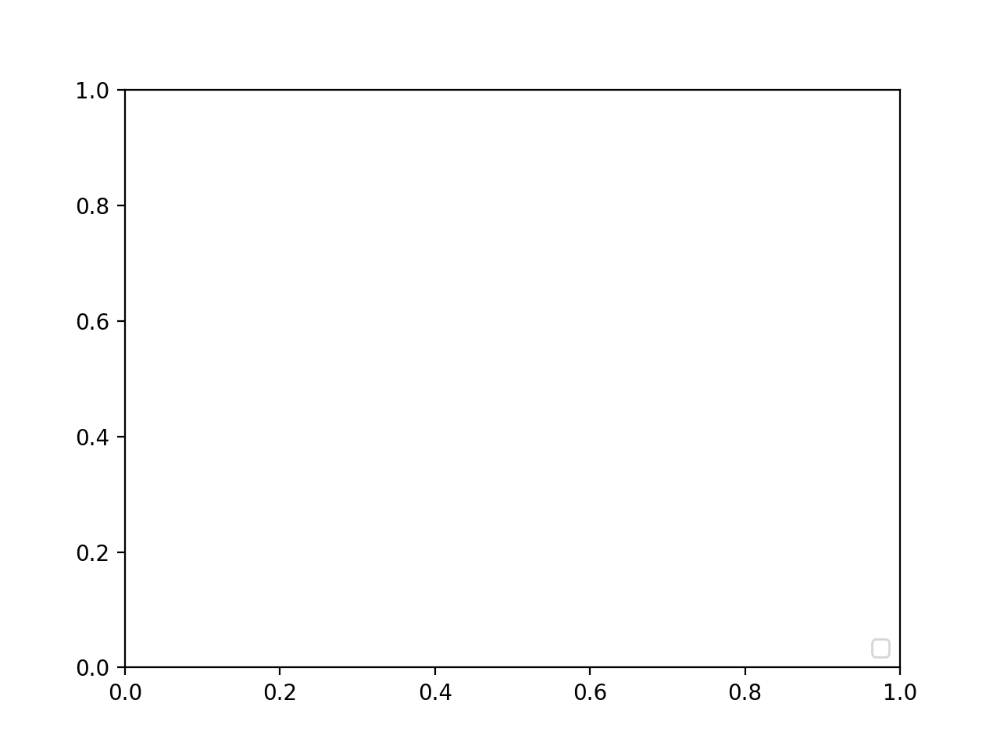

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


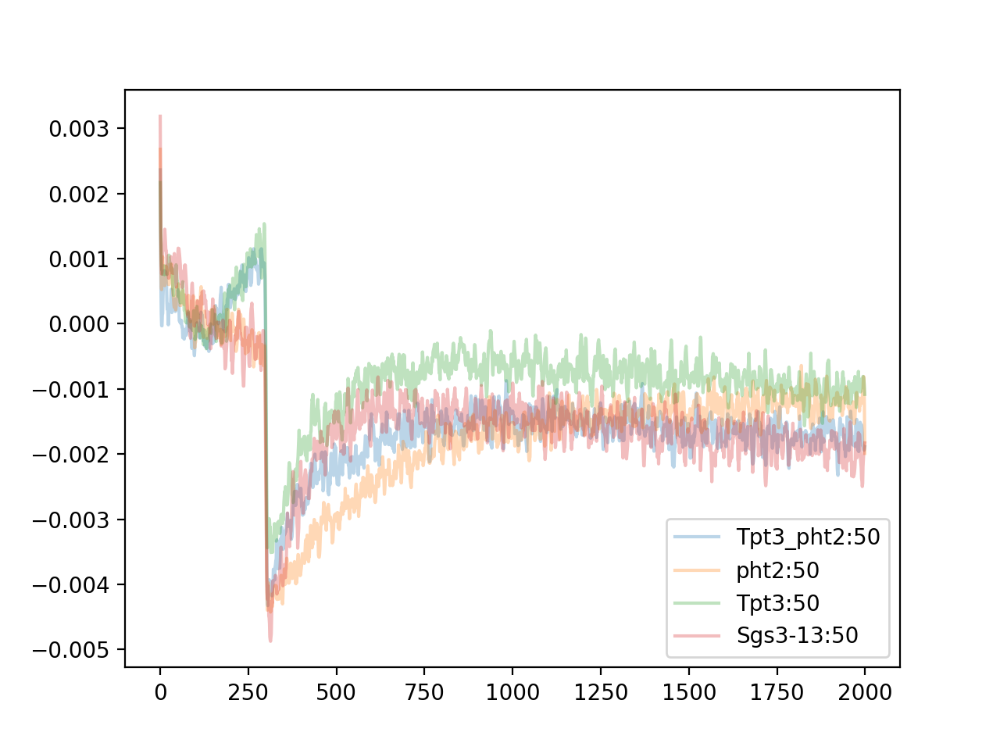

In [85]:

# deltaA_cor_535
ECS_protocol_labels = ['lirk_parsing_induction', 'lirk_parsing_decay']

wls = [505, 520, 535]
for ECS_protocol_label in ECS_protocol_labels:
    plt.figure()
    
    
    for DF_index in project_DF.index:
        ECS_label = ECS_protocol_label + '_ECS'
        project_DF['data'][DF_index][ECS_label] = 0
        project_DF['data'][DF_index][ECS_label] = project_DF['data'][DF_index][ECS_label].astype('object')
        name = project_DF['name'][DF_index]

        
        
        if ('paper' not in name):
            selected_traces = project_DF['data'][DF_index][project_DF['data'][DF_index]['modified_protocol_label'] == ECS_protocol_label]
            A = {}
            
            for trace_index in selected_traces.index:
                
                PAR= selected_traces['actinic_intensity'][trace_index]
                if (PAR[0] == 50):
                    #print(PAR)
                    for wl in wls:
                        A[wl] = project_DF['data'][DF_index]['deltaA_cor_' + str(wl)][trace_index]
                    ECS = A[520] - (A[535] + A[505])/2
                    ECS_smoothed = savgol_filter(ECS , 11, 3)
                    ECS_smoothed = ECS_smoothed - np.mean(ECS_smoothed[100:200])
                    plt.plot(ECS_smoothed, label = name + ":" + str(PAR[0]) , alpha = 0.3)
    plt.legend(loc=4)
    plt.show()

In [86]:
#project_DF['data'][DF_index].columns

<IPython.core.display.Javascript object>


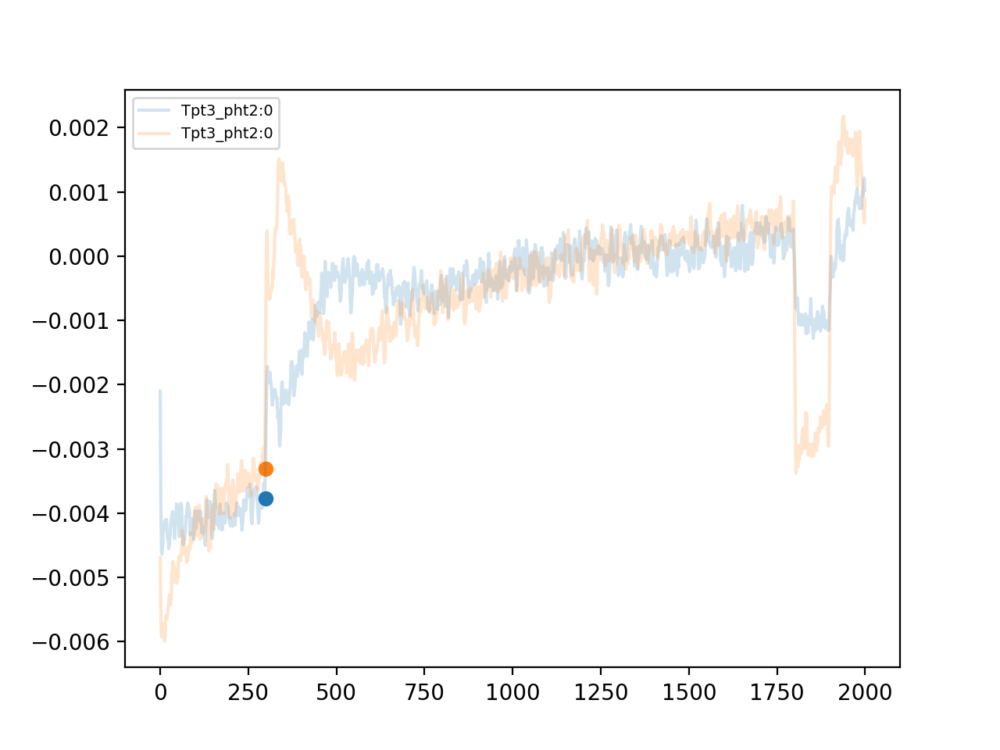

<IPython.core.display.Javascript object>


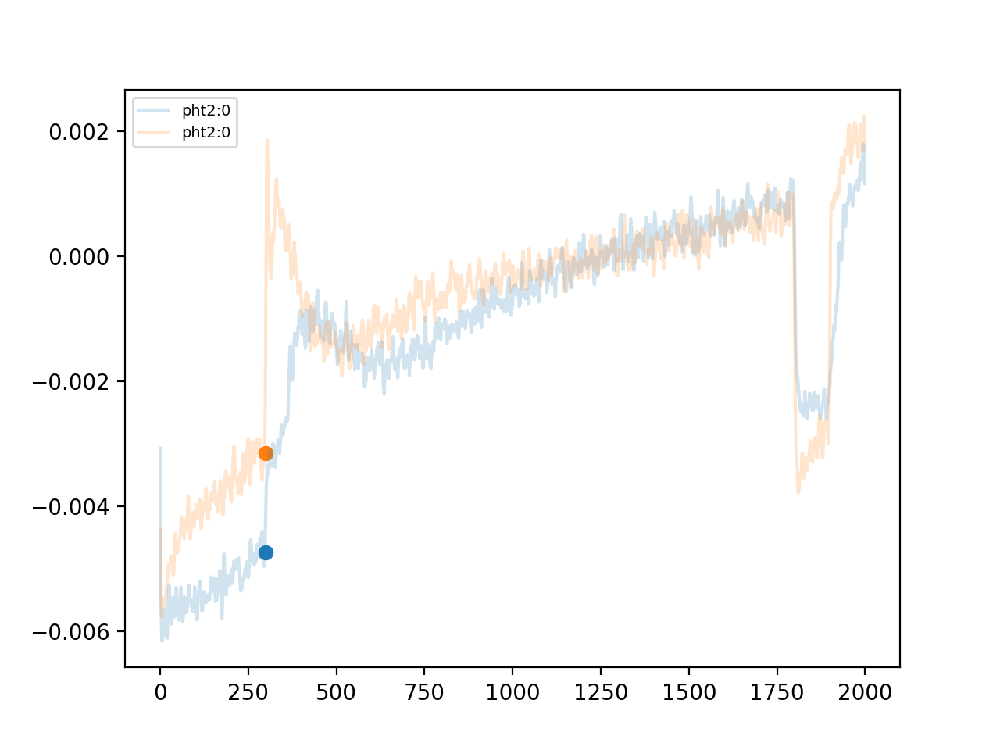

<IPython.core.display.Javascript object>


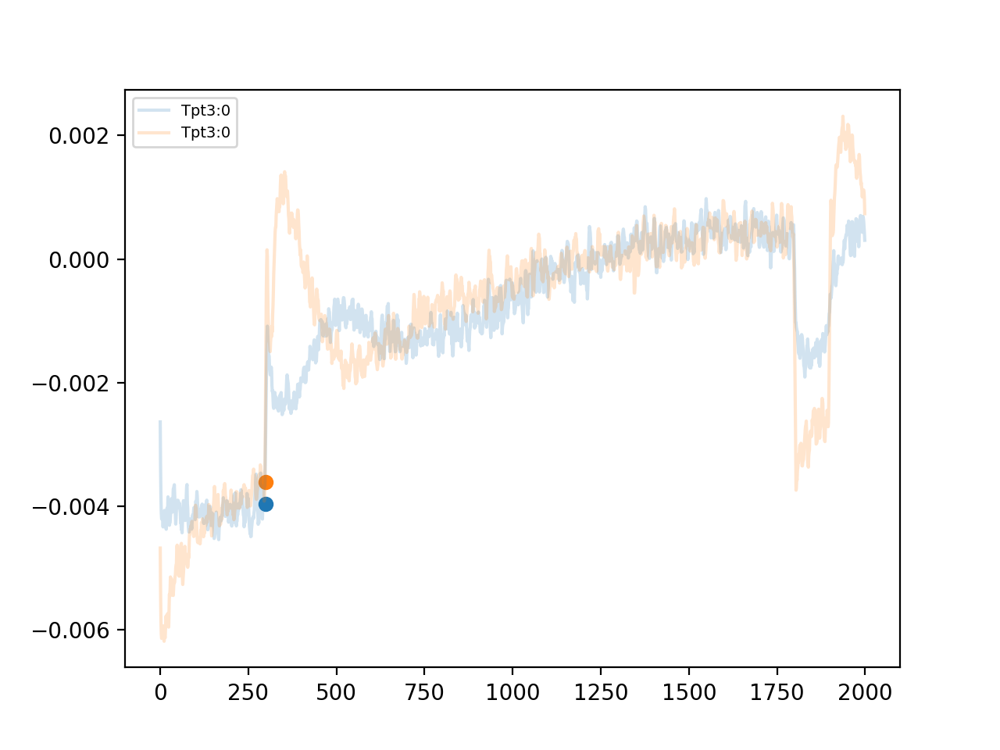

<IPython.core.display.Javascript object>


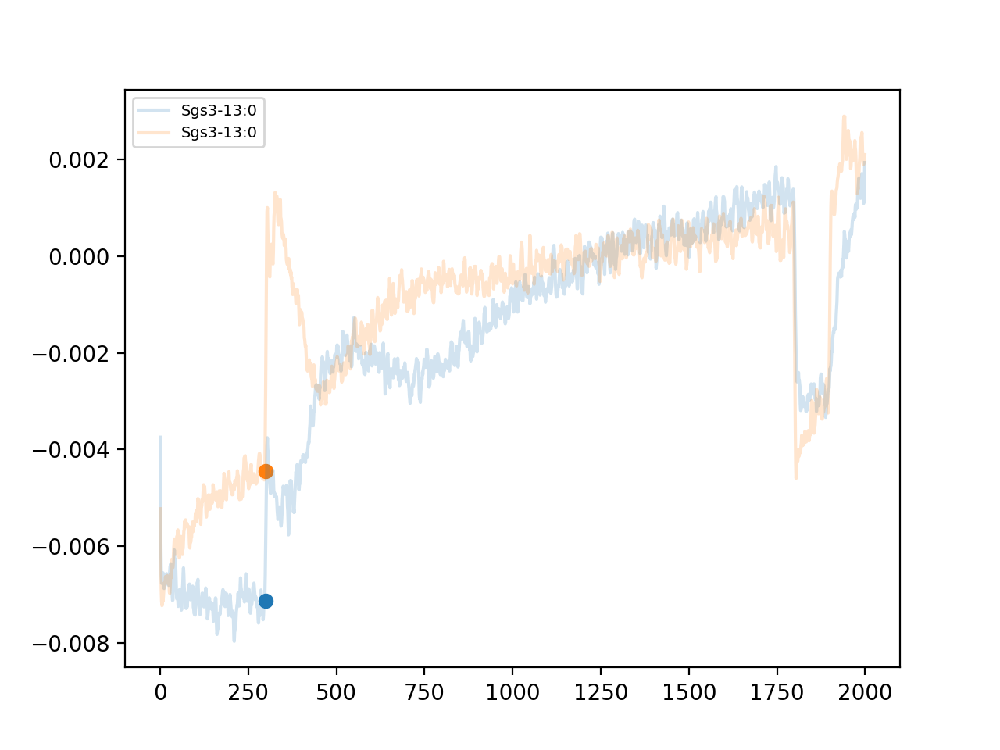

<IPython.core.display.Javascript object>


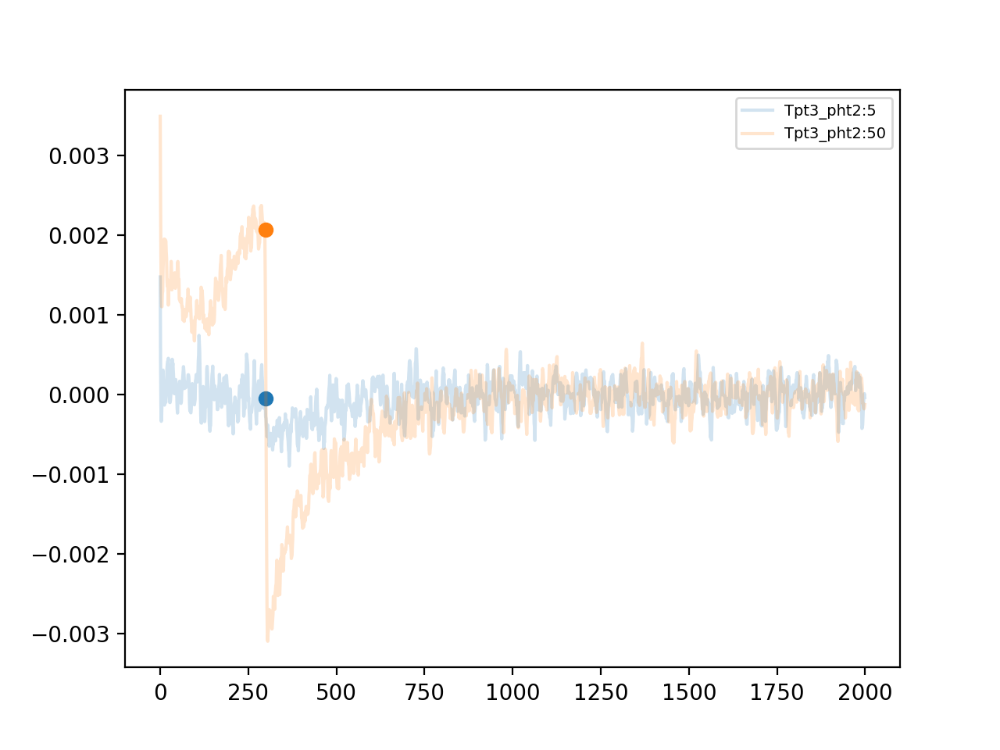

<IPython.core.display.Javascript object>


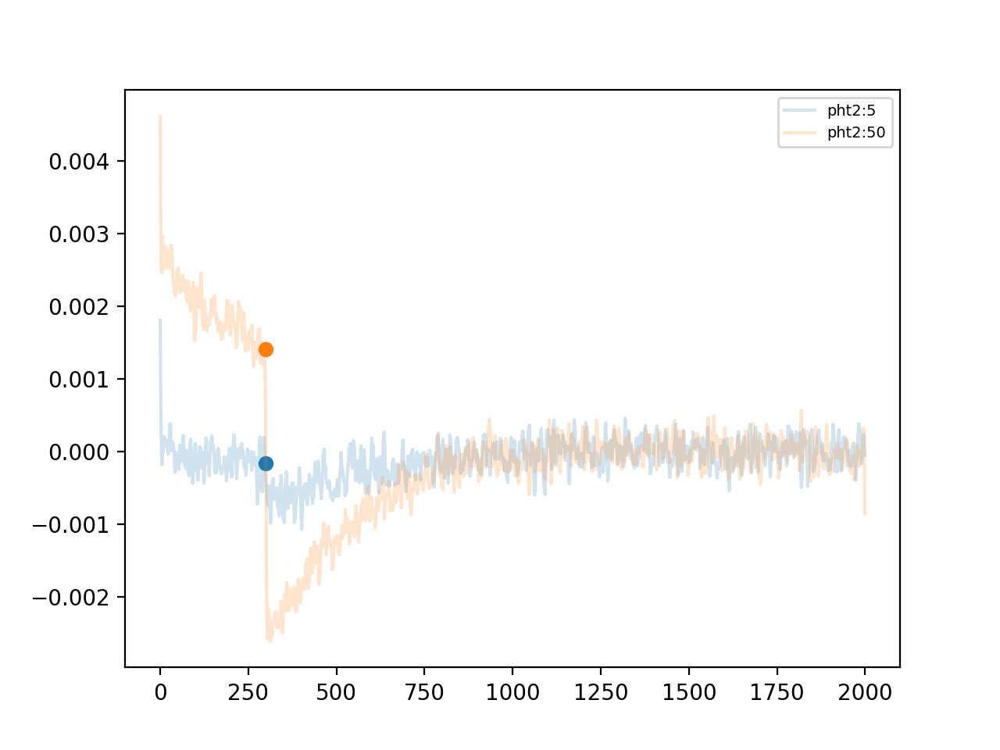

<IPython.core.display.Javascript object>


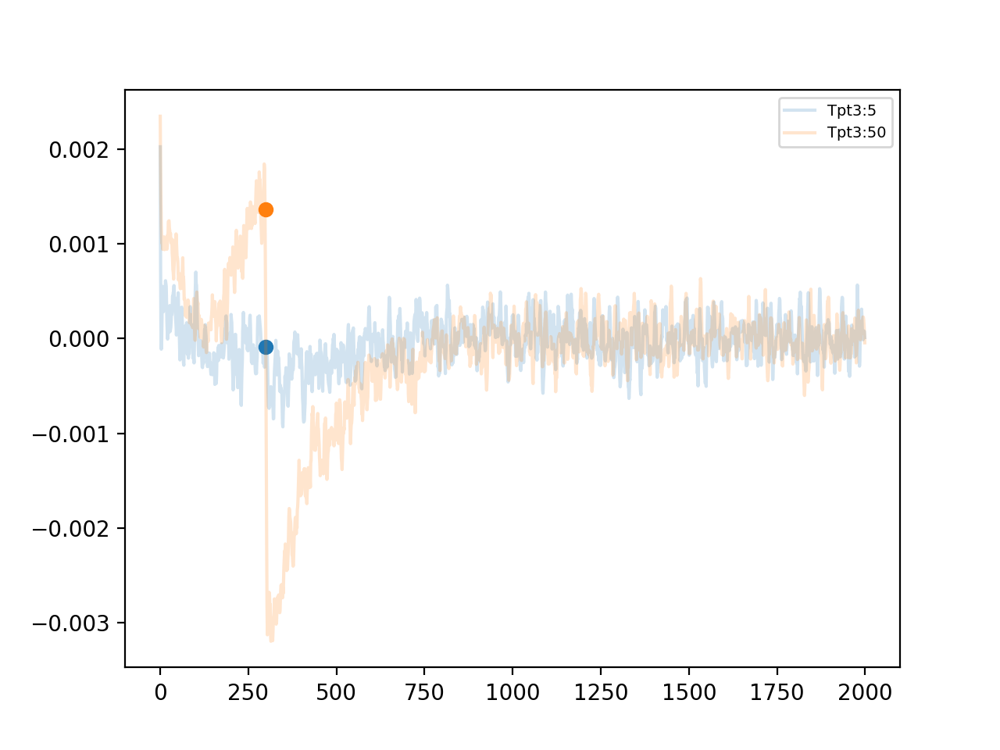

<IPython.core.display.Javascript object>


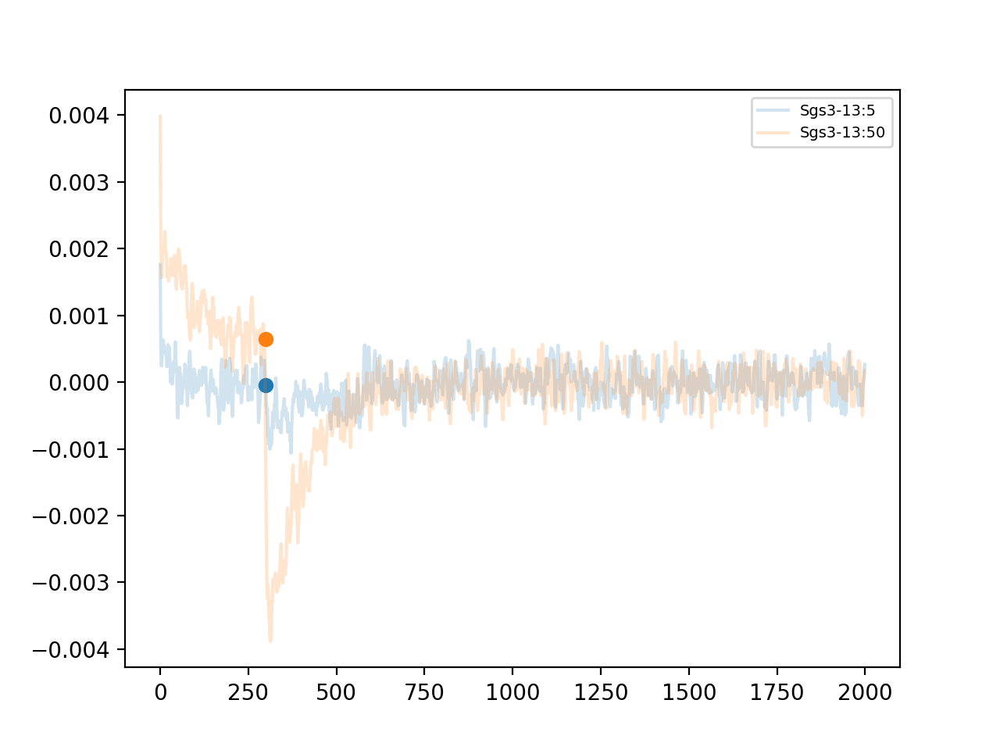

In [87]:
from  scipy import stats
# deltaA_cor_535
ECS_protocol_labels = ['lirk_parsing_induction', 'lirk_parsing_decay']

wls = [505, 520, 535]
for ECS_protocol_label in ECS_protocol_labels:
    
    
    
    for DF_index in project_DF.index:
        
        ECS_label = ECS_protocol_label + '_ECS'
        
        project_DF['data'][DF_index][ECS_label] = 0
        project_DF['data'][DF_index][ECS_label] = project_DF['data'][DF_index][ECS_label].astype('object')
        name = project_DF['name'][DF_index]

        
        
        if ('paper' not in name): # this is thee structure :if A['b']['c']=AA,  AA[AA['d']==sth]
            selected_traces = project_DF['data'][DF_index][project_DF['data'][DF_index]['modified_protocol_label'] == ECS_protocol_label]
            A = {} #new dict? 
            plt.figure()
            
            for trace_index in selected_traces.index:
                PAR= selected_traces['actinic_intensity'][trace_index]
                #print(PAR)
                
                for wl in wls:
                    A[wl] = project_DF['data'][DF_index]['deltaA_cor_' + str(wl)][trace_index]
                ECS = A[520] - (A[535] + A[505])/2
                ECS_smoothed = savgol_filter(ECS , 11, 3)
                start = 1000
                end = len(ECS_smoothed) 

                y = ECS_smoothed[start:end]
                x = np.linspace(start, end, end-start)
                fit_results = stats.linregress(x,y)


                baseline_x= np.linspace(0, len(ECS_smoothed)-1, len(ECS_smoothed))
                baseline_y = fit_results.slope*baseline_x +fit_results.intercept
                
                
                corrected_y = ECS_smoothed - baseline_y 
                
    
                
                project_DF['data'][DF_index][ECS_label][trace_index] = corrected_y 
                
                ECS_ss= np.mean(project_DF['data'][DF_index][ECS_label][trace_index][250:300])
                
                plt.plot(corrected_y, label = name + ":" + str(PAR[0]) , alpha = 0.2) 
                
                plt.scatter(300,ECS_ss) 
        plt.legend(fontsize = 7)
        plt.show()

<IPython.core.display.Javascript object>


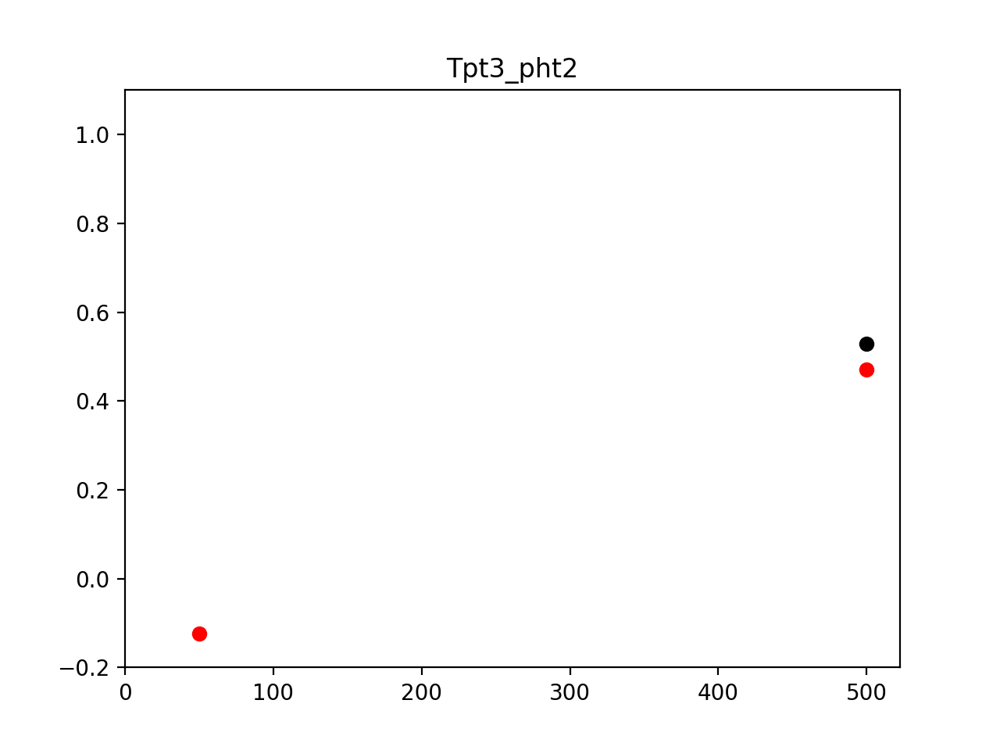

1.1236765639622084
0.5291123719776539


<IPython.core.display.Javascript object>


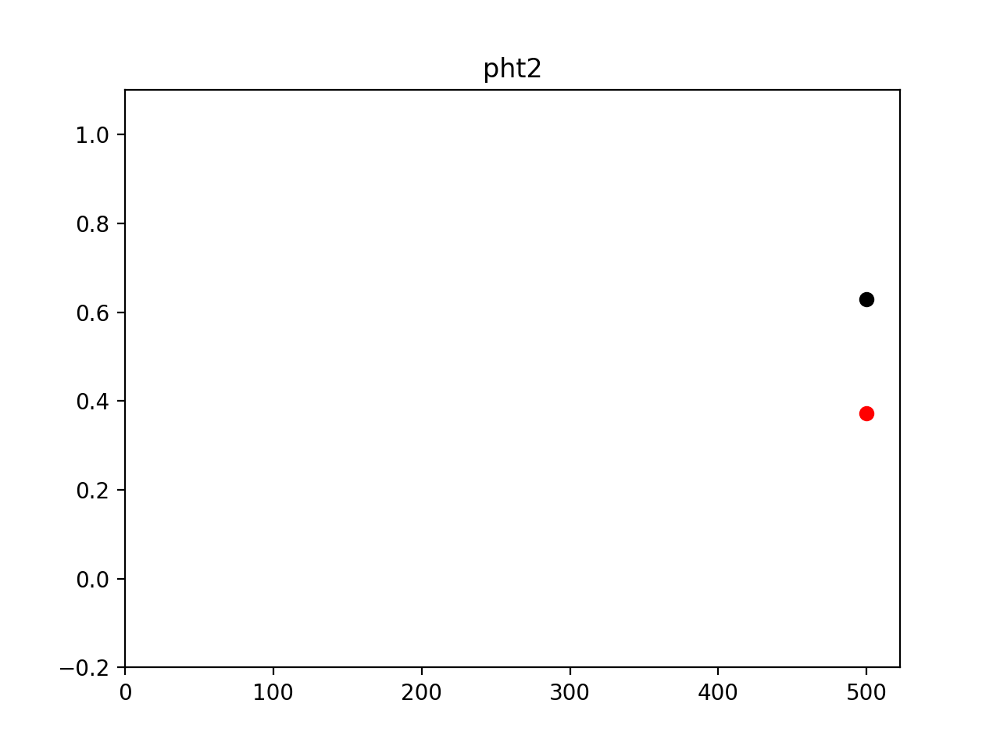

1.2785934746550591
0.6284047264955978


<IPython.core.display.Javascript object>


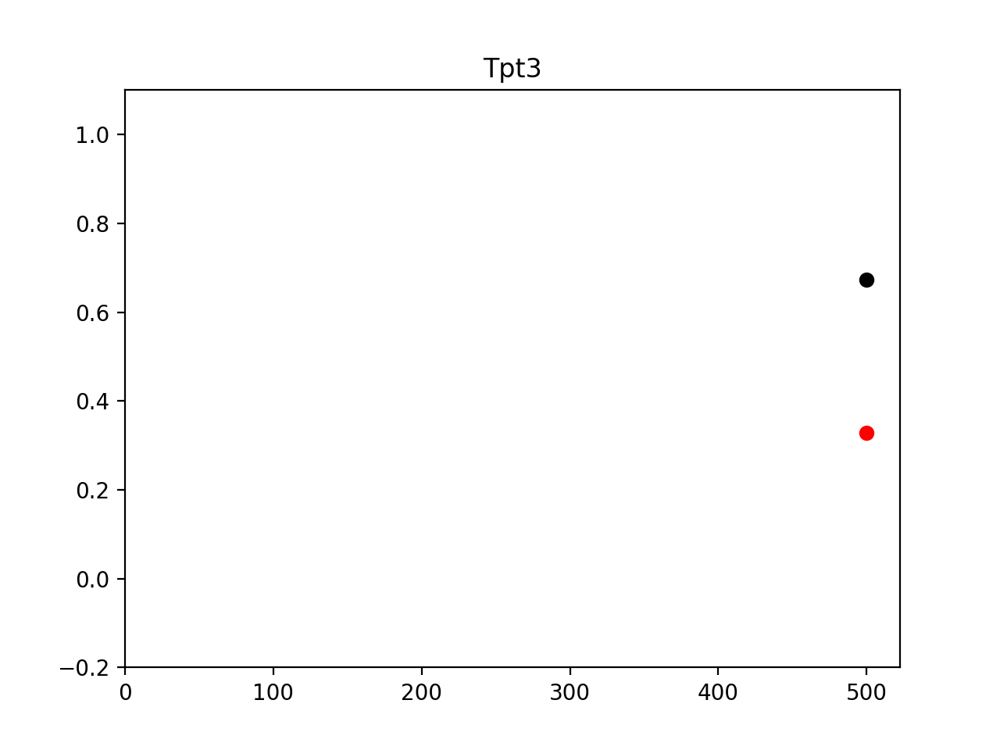

1.390368894431381
0.67218495360098


<IPython.core.display.Javascript object>


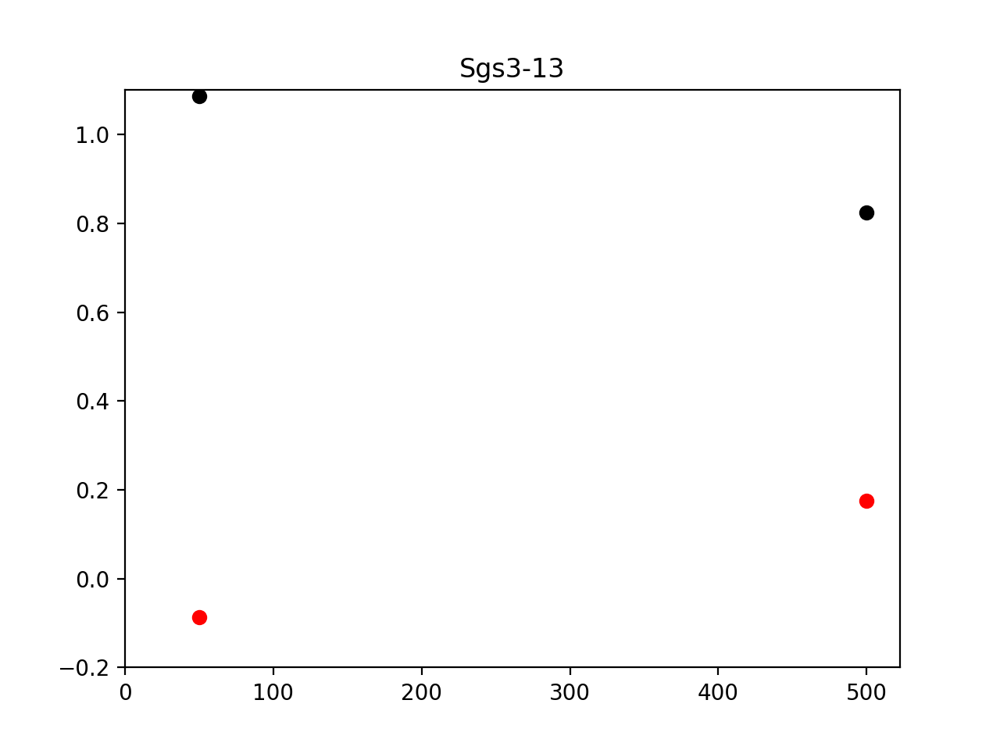

1.0860663430870903
0.824300203288654


In [57]:


for DF_index in project_DF.index:    # go through each exp. in the df
    this_exp_data = project_DF['data'][DF_index]  ## get the experimental df
    name = project_DF['name'][DF_index]
    if ('paper' not in name):
        plt.figure()
        plt.title(name)
    selected_traces = this_exp_data[this_exp_data['modified_protocol_label']== 'lirk_parsing_decay']
    ### we only want traces that modified_protocol_label == lirk_parsing_decay'
    
    project_DF['data'][DF_index]['ECS_t'] = 0
    project_DF['data'][DF_index]['ECS_inv'] = 0
    
    for trace_index in selected_traces.index:
        

        if ('paper' not in name):
        
            trace = selected_traces['lirk_parsing_decay_ECS'][trace_index]
            #print(len(trace))
            PAR = project_DF['data'][DF_index]['actinic_intensity'][trace_index]
            cor_PAR = PAR[0] * 10
            #print (cor_PAR)
            ECS_ss= np.mean(trace[250:300])
            ECS_inv = -np.mean(trace[330:340])
            ECS_t = ECS_ss + ECS_inv
            parsing= ECS_inv / ECS_t
            p_delta_psi = ECS_ss/ECS_t
            print(parsing)
            
            #plt.plot(trace, alpha =0.2)
            project_DF['data'][DF_index].loc[trace_index, 'ECS_t'] =  ECS_t
            
            plt.scatter(cor_PAR,parsing,color= "black", label = 'parsing')
            plt.scatter(cor_PAR,p_delta_psi, color= "red", label = 'dpsi/ECSt')
    #plt.legend()        
    plt.xlim(xmin=0)
    plt.ylim(ymin=-0.2, ymax=1.1)
    plt.show()
    
    

<IPython.core.display.Javascript object>


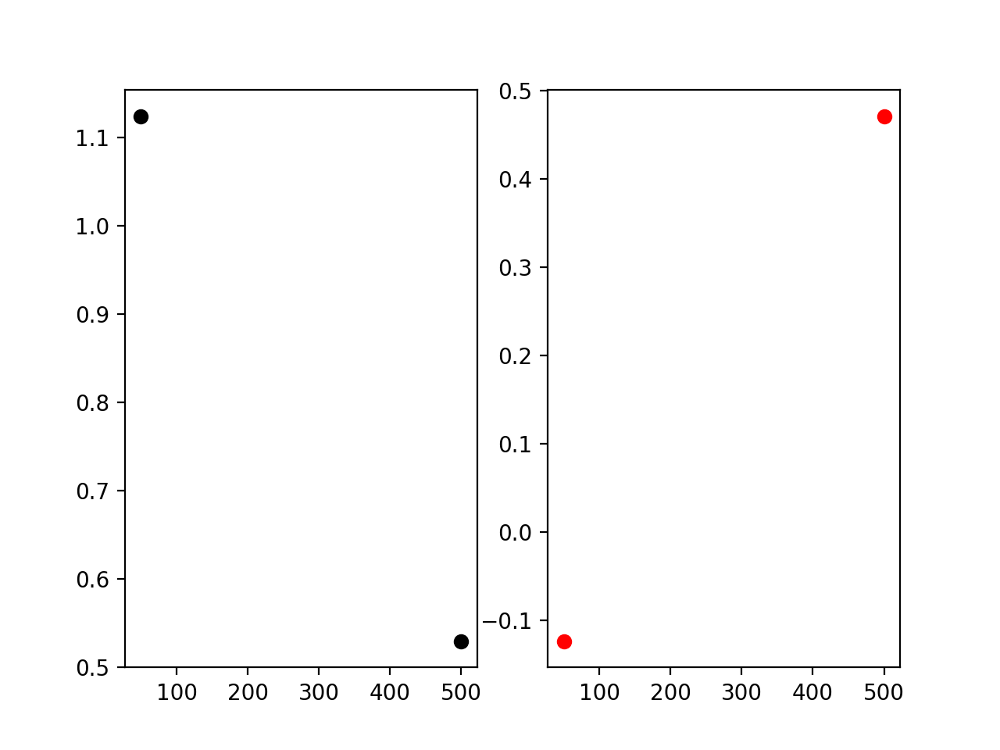

<IPython.core.display.Javascript object>


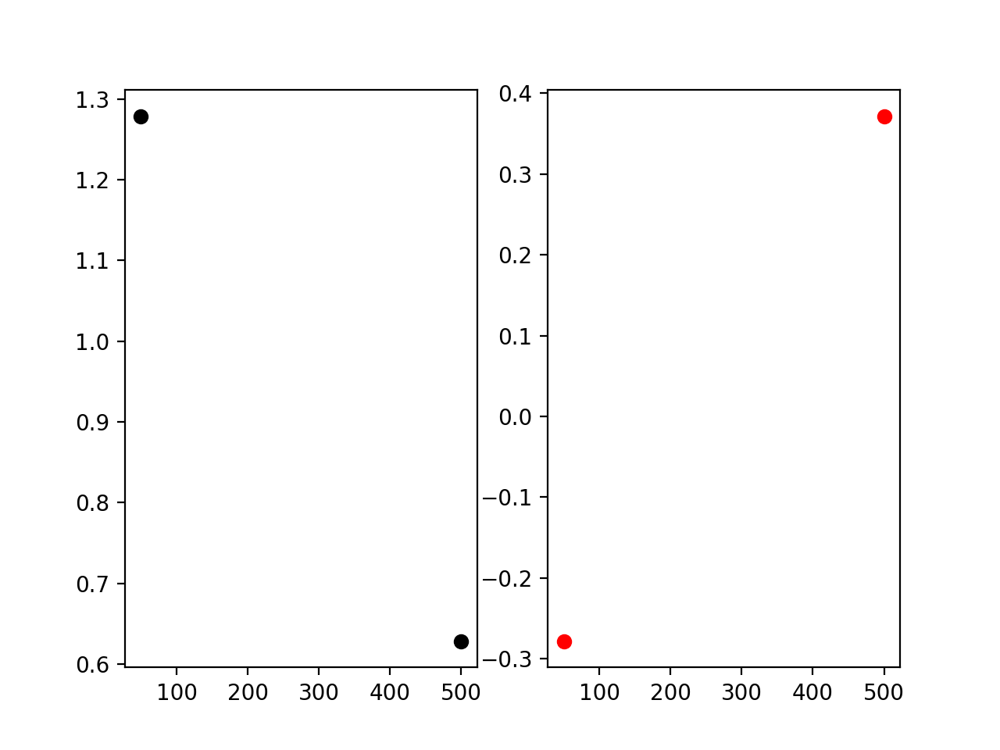

<IPython.core.display.Javascript object>


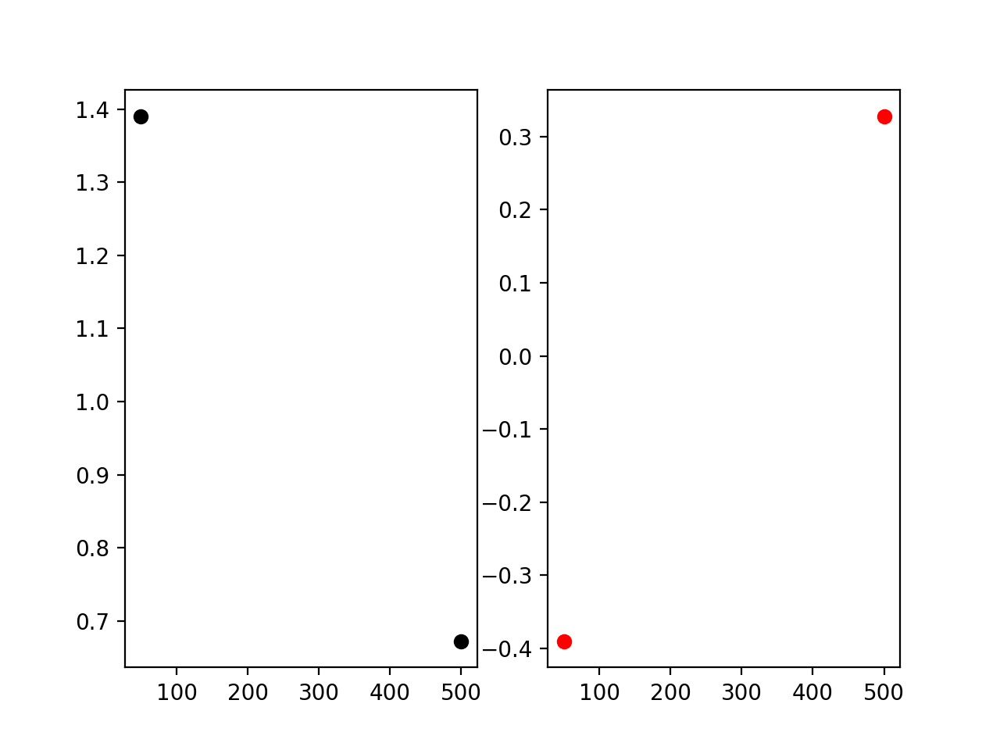

<IPython.core.display.Javascript object>


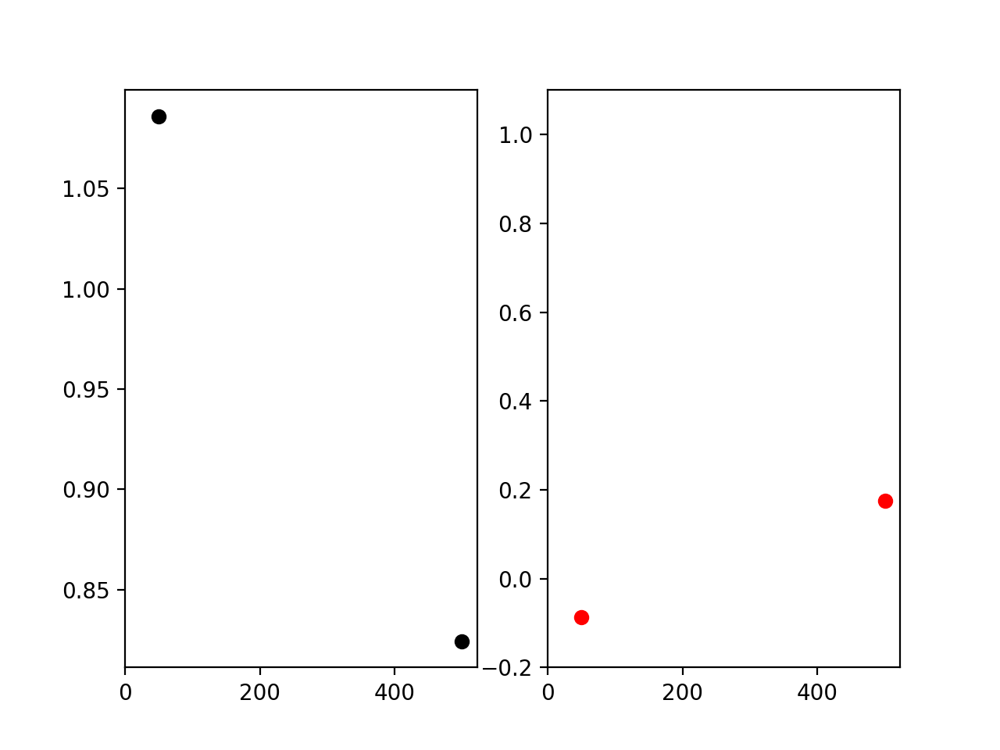

In [58]:




for DF_index in project_DF.index:    # go through each exp. in the df
    this_exp_data = project_DF['data'][DF_index]  ## get the experimental df
    name = project_DF['name'][DF_index]
    if ('paper' not in name):
        fig, (ax1,ax2) = plt.subplots(1, 2, sharex=True)
    selected_traces = this_exp_data[this_exp_data['modified_protocol_label']== 'lirk_parsing_decay']

    ### we only want traces that modified_protocol_label == lirk_parsing_decay'
    
    
    for trace_index in selected_traces.index:
        

        if ('paper' not in name):
        
            trace = selected_traces['lirk_parsing_decay_ECS'][trace_index]
            
            PAR = project_DF['data'][DF_index]['actinic_intensity'][trace_index]
            cor_PAR = PAR[0] * 10
            
            ECS_ss= np.mean(trace[250:300])
            ECS_inv = -np.mean(trace[330:340])
            ECS_t = ECS_ss + ECS_inv
            parsing= ECS_inv / ECS_t
            p_delta_psi = ECS_ss/ECS_t
            
         
            
            ax1.scatter(cor_PAR,parsing,color= "black", label = 'parsing')
            ax2.scatter(cor_PAR,p_delta_psi, color= "red", label = 'dpsi/ECSt')
    #plt.legend()        
plt.xlim(xmin=0)
plt.ylim(ymin=-0.2, ymax=1.1)
plt.show()

    

<IPython.core.display.Javascript object>


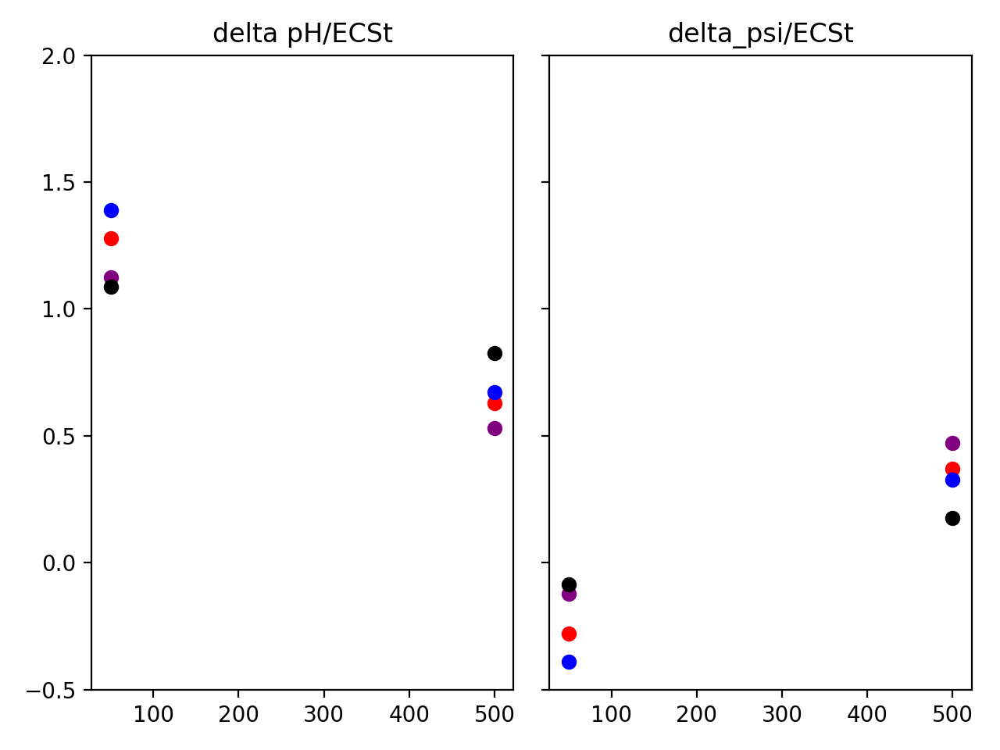

In [90]:

fig, (ax1,ax2) = plt.subplots(1, 2, sharex=True, sharey=True)

for i, index in enumerate(project_DF.index):
    traces_DF = project_DF['data'][index]
    
    name = project_DF['name'][index]
    selected_traces = traces_DF[traces_DF['modified_protocol_label'] == 'lirk_parsing_decay']
    
    if ('paper' not in name):
            
    
        for trace_index in selected_traces.index:
        
            trace = selected_traces['lirk_parsing_decay_ECS'][trace_index]
            
            PAR = project_DF['data'][index]['actinic_intensity'][trace_index]
            cor_PAR = PAR[0] * 10
            
            ECS_ss= np.mean(trace[250:300])
            ECS_inv = -np.mean(trace[330:340])
            ECS_t = ECS_ss + ECS_inv
            parsing= ECS_inv / ECS_t
            p_delta_psi = ECS_ss/ECS_t
         
            ax1.scatter(cor_PAR,parsing,color= colors[name], label = 'parsing')
            ax1.set_title("delta pH/ECSt")
            ax1.set_ylim(-0.5,2)
            
            ax2.scatter(cor_PAR,p_delta_psi, color= colors[name], label = 'dpsi/ECSt')
            ax2.set_title("delta_psi/ECSt")
            ax1.set_ylim(-0.5,2)

plt.tight_layout()

#plt.legend()        
#plt.xlim(xmin=0)

plt.show()

